<a href="https://colab.research.google.com/github/bonvech/MSU-AI/blob/main/Copy_of_L02_Linear_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<font size="6">Линейные модели</font>

Сегодня мы познакомимся с линейными моделями. Это простые модели, которые являются частью многих сложных моделей, о которых мы будем рассказывать на нашем курсе.

В основе линейных моделей лежит линейная функция
$$\large f(\vec x) = (\vec w, \vec x) +b, $$
где $(\vec w, \vec x)$ — скалярное произведение:

$$\large (\vec w, \vec x) = \sum_{i=1}^n{w_ix_i} = w_1x_1+w_2x_2+...+w_ix_i+ ... + w_nx_n$$

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/scalar_product_ways_to_use.png" width="800">

Линейные модели являются простыми предшественниками нейронных сетей.


# Линейная регрессия

**Регрессия** — это одна из трех базовых задач машинного обучения (классификация, регрессия, кластеризация).

В задаче **регрессии** мы используем входные **признаки**, чтобы предсказать **целевые значения**. Например, чтобы предсказать цену жилья по его характеристикам (площадь, этаж, год постройки дома, высота потолков, район, ...). **Линейная регрессия** сводится к тому, чтобы провести “**линию наилучшего соответствия**” через набор точек данных.



##  Модель и ее параметры

Предположим, у нас есть набор точек $\{(x_i, y_i)\}$.

Цель линейной регрессии — **поиск линии, которая наилучшим образом соответствует заданным точкам**. Напомним, что общее уравнение прямой:

$$\large f(x) = w⋅x + b,$$

где $w$ — характеризует наклон линии (в будущем мы будем называть значения $w$ весом, weight) а $b$ — её сдвиг по оси $y$ (bias). Таким образом, решение линейной регрессии определяет значения для $w$ и $b$ так, что $f(x)$ приближается как можно ближе к $y(x)$. Здесь $w$ и $b$ — **параметры модели**.

Отобразим на графике случайные точки, расположенные в окрестности $y(x) = 3⋅x + 2$

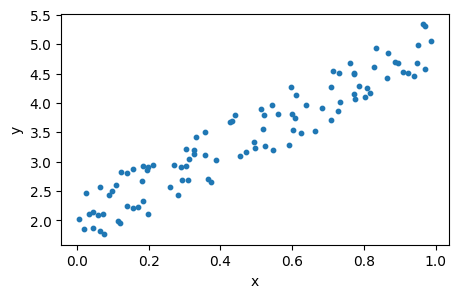

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


np.random.seed(42)
x = np.random.rand(100, 1)
y = 2 + 3 * x + (np.random.rand(100, 1) - 0.5)

plt.figure(figsize=(5, 3))
plt.scatter(x, y, s=10)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

Предположим, что нам неизвестны параметры наклона и сдвига $w$ и $b$. Для их определения мы бы могли рассмотреть все возможные прямые вида $f(x) = w⋅x + b$ и выбрать среди семейства прямых такую, которая лучше всего приближает имеющиеся данные:

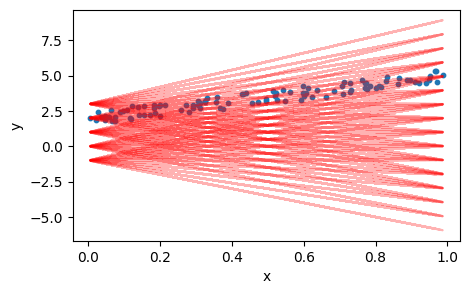

In [ ]:
plt.figure(figsize=(5, 3))
plt.scatter(x, y, s=10)
for w in np.arange(-5.0, 7.0, 1):
    for b in [-1, 0, 1, 2, 3]:
        y_predicted = b + w * x
        plt.plot(x, y_predicted, color="r", alpha=0.3)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

**Модель** $f(x) = w⋅x + b$ задаёт параметрическое семейство функций, а **выбор "правильного" представителя** из **параметрического семейства** и называется **обучением** модели:

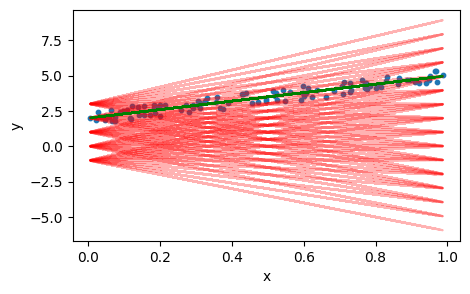

In [ ]:
plt.figure(figsize=(5, 3))
plt.scatter(x, y, s=10)
for w in np.arange(-5.0, 7.0, 1):
    for b in [-1, 0, 1, 2, 3]:
        y_predicted = b + w * x
        plt.plot(x, y_predicted, color="r", alpha=0.3)
plt.plot(x, 2 + 3 * x, color="g")
plt.xlabel("x")
plt.ylabel("y")
plt.show()

## Функция потерь

Как выбрать параметры?

**Функция потерь** позволяет вычислить меру количества ошибок. Для задачи **регрессии** такой мерой может быть **расстояние** между предсказанным значением $f(x)$ и его фактическим значением. Распространенной функцией потерь является **средняя квадратичная ошибка** (MSE). Чтобы вычислить MSE, мы просто берем все значения ошибок, считаем квадраты их длин и усредняем.

То есть мы определяем ошибку модели на одном объекте как квадрат расстояния между предсказанием и истинным значением, а общая функция потерь будет задана выражением:

$$l_i =|y_i - f(x_i)| $$

$$ \text{Loss} = \sum l_i^2 = \frac{1}{N} \sum (y_i - f(x_i))^2$$

Для прямой с параметрами $w=4$, $b = 2$ и $w=3$, $b = 2$ (верные значения):

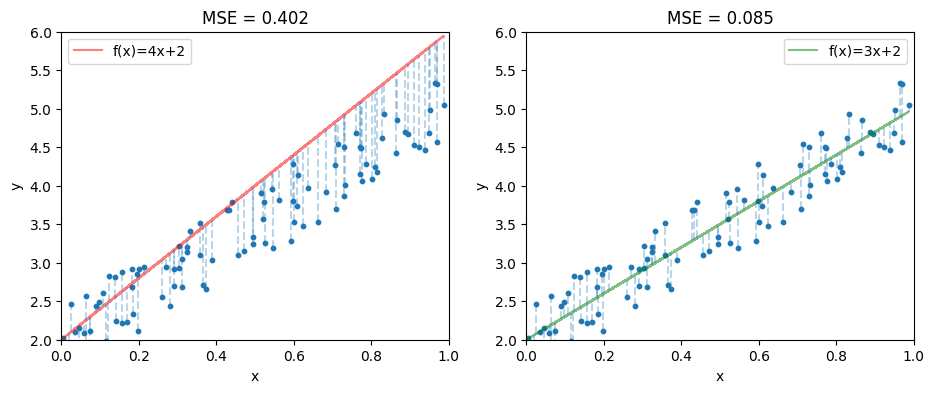

In [ ]:
def plot_delta_line(ax, x, y, w, b, color="r"):
    y_predicted = w * x + b
    # line
    ax.plot(x, y_predicted, color=color, alpha=0.5, label=f"f(x)={w}x+{b}")
    # delta
    for x_i, y_i, f_x in zip(x, y, y_predicted):
        ax.vlines(x=x_i, ymin=min(f_x, y_i), ymax=max(f_x, y_i), ls="--", alpha=0.3)
    # MSE
    loss = np.sum((y - (w * x + b)) ** 2) / (len(x))
    ax.set_title(f"MSE = {loss:.3f}")
    ax.legend()


fig, axs = plt.subplots(1, 2, figsize=(11, 4))

# plot x_i y_i (dots)
for ax in axs:
    ax.scatter(x, y, s=10)
    ax.set_xlim([0, 1])
    ax.set_ylim([2, 6])
    ax.set_xlabel("x")
    ax.set_ylabel("y")

plot_delta_line(axs[0], x, y, w=4, b=2, color="r")
plot_delta_line(axs[1], x, y, w=3, b=2, color="g")

plt.show()

Задача **поиска оптимальных параметров** модели сводится к задаче **поиска минимума функции потерь**.

## Поиск локального минимума

Посмотрим, как будет выглядеть ландшафт функции потерь для нашей задачи.

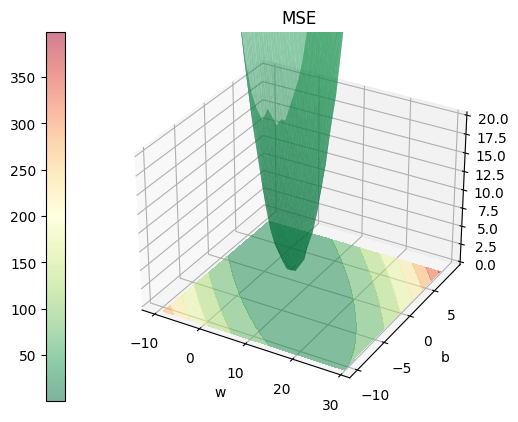

In [ ]:
w = np.arange(-10, 30, 1)
b = np.arange(-10, 10, 1)

w, b = np.meshgrid(w, b)

loss = np.zeros_like(w)
for i in range(w.shape[0]):
    for j in range(w.shape[1]):
        loss[i, j] = np.sum((y - (w[i, j] * x + b[i, j])) ** 2) / (len(x))

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
surf = ax.plot_surface(w, b, loss, cmap=plt.cm.RdYlGn_r, alpha=0.5)

ax.contourf(w, b, loss, zdir="z", offset=-1, cmap="RdYlGn_r", alpha=0.5)
ax.set_zlim(0, 20)

ax.set_xlabel("w")
ax.set_ylabel("b")
ax.set_title("MSE")

fig.colorbar(surf, location="left")
plt.show()

Необходимым (но недостаточным) условием локального минимума дифференцируемой функции является равенство нулю частных производных:

$$	\begin{equation*}
 \begin{cases}
   \displaystyle\frac{\partial \text{Loss}}{\partial w}=0,
   \\
   \displaystyle\frac{\partial \text{Loss}}{\partial b}=0.
 \end{cases}
\end{equation*} $$

Т.к. MSE для линейной регрессии — полином второй степени относительно $w$ и $b$, а полином второй степени не может иметь больше одного экстремума, то локальный минимум будет глобальным.

##  Метод наименьших квадратов

Реализуем простейшую модель линейной регрессии с использованием библиотеки NumPy на датасете, определённом выше.

Используем метод наименьших квадратов: [МНК, простейшие частные случаи 📚[wiki]](https://ru.wikipedia.org/wiki/Метод_наименьших_квадратов#Простейшие_частные_случаи).

$$w = \frac{n\sum_{i=1}^nx_iy_i - (\sum_{i=1}^nx_i)(\sum_{i=1}^ny_i)}{n\sum_{i=1}^nx_t^2 - (\sum_{i=1}^n x_t)^2};$$

$$b = \frac{\sum_{i=1}^ny_i - w(\sum_{i=1}^nx_i)}{n}.$$

По сути метод наименьших квадратов — это решение системы уравнений выше.

Estimated coefficients:
b = 2.014 
w = 2.966
Final equation: 
y = 2.966x +2.014


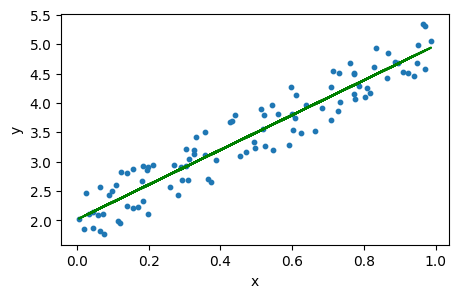

In [ ]:
def estimate_coef(x, y):
    n = len(x)
    w = (n * sum(np.multiply(x, y)) - sum(x) * sum(y)) / (
        n * sum(np.multiply(x, x)) - sum(x) ** 2
    )
    b = (sum(y) - w * sum(x)) / n
    return w, b


w, b = estimate_coef(x, y)

y_predicted = w * x + b

print(f"Estimated coefficients:\nb = {b[0]:.3f} \nw = {w[0]:.3f}")
print(f"Final equation: \ny = {w[0]:.3f}x +{b[0]:.3f}")

plt.figure(figsize=(5, 3))
plt.scatter(x, y, s=10)
plt.plot(x, y_predicted, color="g")
plt.xlabel("x")
plt.ylabel("y")
plt.show()

Полученное решение близко к исходной  зависимости $y=3\cdot x + 2$.

Для многомерного случая МНК можно записать [решение 📚[book]](https://sun.tsu.ru/mminfo/2016/Dombrovski/book/chapter-3/chapter-3-2.htm) в матричном виде:  
$$\vec w = (X^TX)^{-1}X^T\vec y$$
где $\vec w$ — вектор параметров модели, включающий $b$ (при записи этого решения используется трюк “столбец единиц”, о котором мы поговорим чуть позже),
$X$ — матрица входных признаков (с единичным столбцом),
$\vec y$ — вектор предсказываемых значений.



## Метрики регрессии

С одной из метрик регрессии мы уже познакомились: это $\text{MSE}$, которую мы минимизировали в методе наименьших квадратов. Стоит отметить, что $\text{MSE}$ имеет [размерность 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%90%D0%BD%D0%B0%D0%BB%D0%B8%D0%B7_%D1%80%D0%B0%D0%B7%D0%BC%D0%B5%D1%80%D0%BD%D0%BE%D1%81%D1%82%D0%B8) квадрата размерности предсказываемого значения.

$$ \text{MSE}  = \frac{1}{N} \sum (y_i - f(x_i))^2$$

Чтобы получить оценку ошибки той же размерности, можно взять корень (root) от $\text{MSE}$. Это метрика $\text{RMSE}$:

$$ \text{RMSE} = \sqrt{\frac{1}{N} \sum (y_i - f(x_i))^2}$$

Или посчитать среднюю абсолютную ошибку $\text{MAE}$:

$$ \text{MAE} = \frac{1}{N} \sum |y_i - f(x_i)|$$



Существуют и более специфичные метрики, например, $R^2$, которая принимает значения от $(-\inf, 1]$, где $1$  —  наилучший вариант. $R^2$ называется [коэффициентом детерминации 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%9A%D0%BE%D1%8D%D1%84%D1%84%D0%B8%D1%86%D0%B8%D0%B5%D0%BD%D1%82_%D0%B4%D0%B5%D1%82%D0%B5%D1%80%D0%BC%D0%B8%D0%BD%D0%B0%D1%86%D0%B8%D0%B8) и характеризует долю дисперсии целевого значения, которую объясняет модель.

$$R^2 = 1 - \frac{\text{MSE}}{\sigma^2}=1 - \frac{\sum {(y_i-f(x_i))^2}}{\sum{(y_i-\bar{y})^2}},$$

$$\bar{y} = \frac{1}{N}\sum {y_i},$$

где $\sigma^2$ — дисперсия.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L02/linear_regression.png" width="600"></center>

<center><em>Когда $R^2$ около нуля, модель плохо объясняет данные</em></center>

<center><em>Source: <a href="https://xkcd.com/1725">https://xkcd.com/1725</a></em></center>

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


def print_metrics(y_true, y_predicted):
    print(f"Mean squared error: {mean_squared_error(y_true, y_predicted):.3f}")
    print(
        "Root mean squared error: ",
        f"{mean_squared_error(y_true, y_predicted, squared=False):.3f}",
    )
    print(f"Mean absolute error: {mean_absolute_error(y_true, y_predicted):.3f}")
    print(f"R2 score: {r2_score(y_true, y_predicted):.3f}")


print_metrics(y, y_predicted)

Mean squared error: 0.085
Root mean squared error:  0.291
Mean absolute error: 0.256
R2 score: 0.901


Подробнее про метрики можно почитать [тут 📚[book]](https://academy.yandex.ru/handbook/ml/article/metriki-klassifikacii-i-regressii). Там же вы можете найти информацию об относительных ошибках, выражаемых в процентах. Выбор метрики в реальной задаче зависит от традиции, сложившейся в области, поэтому для выбора метрик важно провести литературный обзор.


## Модель линейной регрессии из библиотеки scikit-learn

Свою линейную регрессию мы написали. Теперь изучим, как работать с моделью из Sklearn.

Рассмотрим следующую задачу. Пусть мы хотим построить модель предсказания успеваемости студента на основе информации о величине потраченного им на изучение материала количества времени в часах. Это пример простейшей задачи линейной регрессии.

Загрузим датасет [Students Score 🛠️[doc]](https://www.kaggle.com/datasets/shubham47/students-score-dataset-linear-regression). Датасет содержит два числовых значения — часы и результаты.

In [ ]:
import pandas as pd

dataset = pd.read_csv(
    "https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/student_scores.csv"
)
print(dataset.shape)
dataset.head()

(25, 2)


,Hours,Scores
0,2.5,21
1,5.1,47
2,3.2,27
3,8.5,75
4,3.5,30


Построим график зависимости одного от другого, а также отобразим распределения каждой из переменных

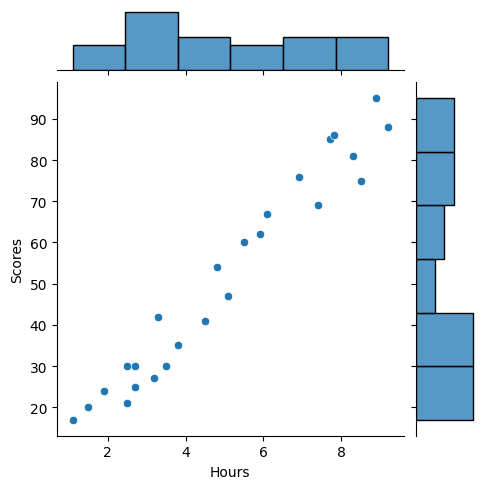

In [ ]:
import seaborn as sns

sns.jointplot(data=dataset, x="Hours", y="Scores", height=5)
plt.show()

Разделим наши данные на train и test:

In [ ]:
from sklearn.model_selection import train_test_split

x = dataset.iloc[:, :-1].values  # column Hours
y = dataset.iloc[:, 1].values  # column Score

x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, random_state=42
)

В случае сложного, многомодового распределения значений целевой переменной в задаче регрессии может быть полезно задуматься о стратификации данных. Стратификация данных для задачи регрессии специфична и не реализована в Sklearn, о ней можно почитать в [Regression Analysis Based on Stratified Samples 🎓[article]](https://www.jstor.org/stable/2336525?seq=1), пример кода можно найти на [форуме ✏️[blog]](https://datascience.stackexchange.com/questions/33140/stratify-on-regression).

Теперь создадим модель для линейной регрессии. Чтобы не писать с нуля, воспользуемся готовой моделью из библиотеки Sklearn:

In [ ]:
from sklearn.linear_model import LinearRegression

regressor = LinearRegression()

И обучим ее:

In [ ]:
regressor.fit(x_train, y_train)

LinearRegression()

Посмотрим, что получилось:

In [ ]:
x_train.shape

(20, 1)

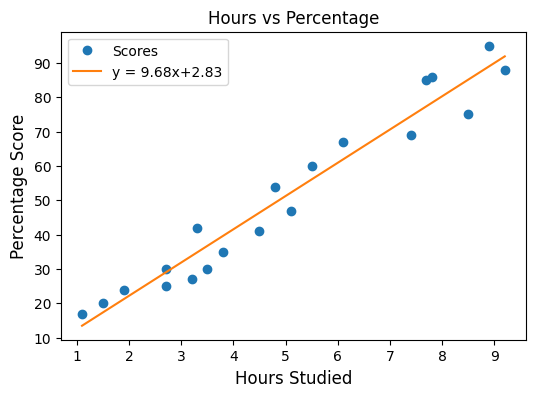

In [ ]:
x_points = np.linspace(min(x_train), max(x_train), 100)  # 100 dots at min to max
y_pred = regressor.predict(x_points)

plt.figure(figsize=(6, 4))
plt.plot(x_train, y_train, "o", label="Scores")
plt.plot(
    x_points,
    y_pred,
    label="y = %.2fx+%.2f" % (regressor.coef_[0], regressor.intercept_),
)
plt.title("Hours vs Percentage", size=12)
plt.xlabel("Hours Studied", size=12)
plt.ylabel("Percentage Score", size=12)
plt.legend()
plt.show()

Теперь сделаем предсказание для тестовой выборки:

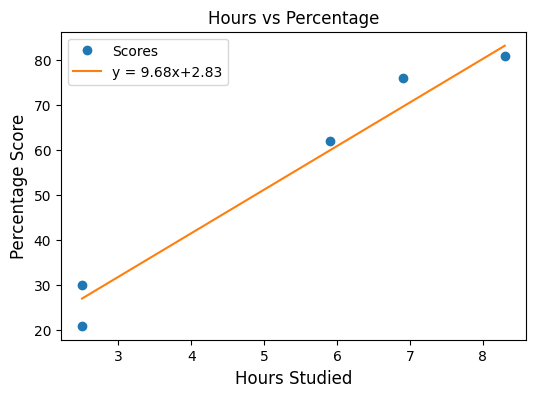

In [ ]:
y_pred = regressor.predict(x_test)

x_points = np.linspace(min(x_test), max(x_test), 100)
y_pred = regressor.predict(x_points)

plt.figure(figsize=(6, 4))
plt.plot(x_test, y_test, "o", label="Scores")
plt.plot(
    x_points,
    y_pred,
    label="y = %.2fx+%.2f" % (regressor.coef_[0], regressor.intercept_),
)
plt.title("Hours vs Percentage", size=12)
plt.xlabel("Hours Studied", size=12)
plt.ylabel("Percentage Score", size=12)
plt.legend()
plt.show()

Выглядит неплохо.

Посчитаем метрики для наших значений:

In [ ]:
y_pred = regressor.predict(x_test)
print_metrics(y_test, y_pred)

Mean squared error: 18.943
Root mean squared error:  4.352
Mean absolute error: 3.921
R2 score: 0.968


Будьте осторожнее: модели отражают только те закономерности, которые видели в данных. Вероятность того, что студент, потративший на подготовку 20 часов, получит больше максимального балла, мала.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L02/extrapolating.png" width="500"></center>

<center><em>Source: <a href="https://xkcd.com/605">https://xkcd.com/605</a></em></center>





# Метод градиентного спуска

Мы решали задачу линейной регрессии аналитически (МНК), но это не всегда возможно по нескольким причинам:
* Для аналитического решения нужно считать обратную матрицу, это вычислительно сложно и матрица бывает плохо определенной.
* Данных может быть слишком много для того, чтобы их можно было одновременно положить в память для расчета обратной матрицы.
* Модели могут быть слишком сложными для поиска аналитического решения. Более того, для сложных моделей ландшафт функции потерь может иметь сложный рельеф с несколькими локальными минимумами.

Давайте поговорим о том, что делать в таком случае.

## Градиент

Метод, который мы будем использовать, называется **“метод градиентного спуска”**. Для начала вспомним, что такое **градиент**. Возьмем функцию двух переменных:

$$\large f(x, y) = \sin(x\cdot y)$$

Она будет отличаться от функции потерь, которую мы визуализировали, тем, что у нее будет не один экстремум, а сложный рельеф. Рассчитаем ее на диапазоне значений от $0$ до $4$.

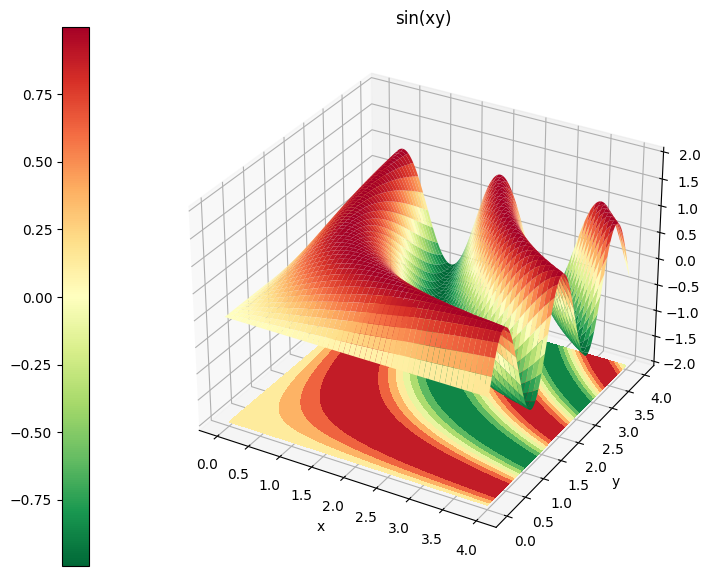

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

f = lambda x, y: np.sin(x * y)

x = np.linspace(0, 4, 1000)
y = np.linspace(0, 4, 1000)
xx, yy = np.meshgrid(x, y)
zz = f(xx, yy)

fig = plt.figure(figsize=(20, 7))


def show_3d(xx, yy, zz, fig):
    ax = fig.add_subplot(121, projection="3d")
    surf = ax.plot_surface(xx, yy, zz, cmap=plt.cm.RdYlGn_r)

    ax.contourf(xx, yy, zz, zdir="zz", offset=-2, cmap="RdYlGn_r")
    ax.set_zlim(-2, 2)

    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title("sin(xy)")
    fig.colorbar(surf, location="left")


show_3d(xx, yy, zz, fig)
plt.show()

Eсли $\varphi = \varphi(\vec{x})=\varphi(x_1 \dots x_n)$ — функция $n$ переменных, то её градиентом называется $n$-мерный вектор:
$$
\nabla \varphi(\vec{x})=
\begin{bmatrix}
\displaystyle\frac{\partial\varphi}{\partial x_1}\\
\displaystyle\frac{\partial\varphi}{\partial x_2}\\
...\\
\displaystyle\frac{\partial\varphi}{\partial x_n}\\
\end{bmatrix}
$$


Посчитаем градиент нашей функции $f(x, y)$. Для этого воспользуемся [**таблицей производных** 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%A2%D0%B0%D0%B1%D0%BB%D0%B8%D1%86%D0%B0_%D0%BF%D1%80%D0%BE%D0%B8%D0%B7%D0%B2%D0%BE%D0%B4%D0%BD%D1%8B%D1%85) и правилом вычисления [**производной сложной функции** 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%94%D0%B8%D1%84%D1%84%D0%B5%D1%80%D0%B5%D0%BD%D1%86%D0%B8%D1%80%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5_%D1%81%D0%BB%D0%BE%D0%B6%D0%BD%D0%BE%D0%B9_%D1%84%D1%83%D0%BD%D0%BA%D1%86%D0%B8%D0%B8) (Chain-rule):
$$\frac {\partial f} {\partial x} = \frac {\partial f} {\partial t} \cdot \frac {\partial t} {\partial x}$$

Это правило очень нам пригодится в будущем.

$$\nabla f(x, y)=\begin{bmatrix}
\displaystyle\frac{\partial f}{\partial x}\\
\displaystyle\frac{\partial f}{\partial y}\\
\end{bmatrix}
=\begin{bmatrix}
\displaystyle\frac{\partial\sin(xy)}{\partial(xy)}\cdot\frac{\partial(xy)}{\partial x}\\
\displaystyle\frac{\partial\sin(xy)}{\partial(xy)}\cdot\frac{\partial(xy)}{\partial y}\\
\end{bmatrix}
= \begin{bmatrix}
\cos(xy)\cdot y\\
\cos(xy)\cdot x\\
\end{bmatrix}
$$

Посчитаем градиент на том же диапазоне (сетка реже, т.к. мы будем рисовать не точки, а стрелочки):

In [ ]:
gradf = lambda x, y: (np.cos(x * y) * y, np.cos(x * y) * x)

xsmall = np.linspace(0, 4, 15)
ysmall = np.linspace(0, 4, 15)
xxsmall, yysmall = np.meshgrid(xsmall, ysmall)
gradx, grady = gradf(xxsmall, yysmall)

Так как **значение градиента в точке** — это вектор, мы можем говорить о его **величине** и **направлении**. Визуализируем наши расчеты: посмотрим на ландшафт функции $f(x, y)$ и направления градиентов.


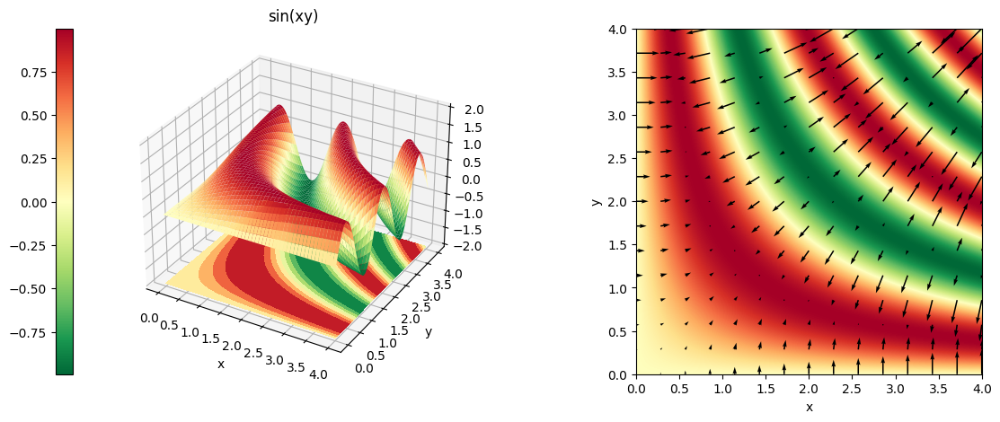

In [ ]:
fig = plt.figure(figsize=(15, 5))
show_3d(xx, yy, zz, fig)

ax = fig.add_subplot(122)
ax.imshow(
    zz,
    extent=(np.min(x), np.max(x), np.min(y), np.max(y)),
    cmap="RdYlGn_r",
    origin="lower",
)
ax.set_xlabel("x")
ax.set_ylabel("y")

ax.quiver(xxsmall, yysmall, gradx, grady)
plt.show()

На рисунке выше значения градиента в точке обозначены чёрными стрелочками. Можно заметить, что длина стрелок в  районе максимальных и минимальных значений функции **почти нулевая**, стрелки направлены в направлении возрастания значения функции и наиболее длинные стрелки находятся в области наиболее резкого изменения значений функции.


Это проявление **свойств градиента**:
* Направление $\frac{\nabla f}{||\nabla f||}$ — сообщает нам направление максимального роста функции.

*  Величина $||\nabla f||$ — характеризует мгновенную скорость изменения значений функции.

## Идея градиентного спуска

Загрузим еще раз данные с зависимостью оценок студентов от времени подготовки.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split


dataset = pd.read_csv(
    "https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/student_scores.csv"
)

x = dataset.iloc[:, :-1].values  # column Hours
y = dataset.iloc[:, 1].values  # column Score

x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, random_state=42
)

Скачаем **код для интерактивной визуализации**. Он нужен только для объяснения и **не пригодится вам в работе**. Его разбирать мы не будем. Eсли интересно, можно изучить самостоятельно.

In [ ]:
# @title *Code for interactive visual
# source: https://github.com/TomasBeuzen/deep-learning-with-pytorch

!wget -qN https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L02/interactive_visualization.py

Для простоты рассмотрим одномерный случай. Будем подбирать только $w$, значение $b$ зафиксируем на уровне $2.83$. Визуализируем ошибку и значения $\dfrac{\partial \text{Loss}}{\partial w}$ для MSE Loss.

In [ ]:
from interactive_visualization import plot_grid_search
from sklearn.metrics import mean_squared_error


slopes = np.arange(5, 15, 0.5)
prediction = {f"{w}": w * x_train[:, 0] + 2.83 for w in slopes}
mse = np.array([mean_squared_error(y_train, w * x_train[:, 0] + 2.83) for w in slopes])
dmse_dw = np.array(
    [(2 * x_train[:, 0] * (w * x_train[:, 0] + 2.83 - y_train)).mean() for w in slopes]
)
plot_grid_search(x_train[:, 0], y_train, slopes, prediction, mse, dmse_dw)

 Видно, что оптимальное значение наклона соответствует минимуму MSE и нулю частной производной $\dfrac{\partial \text{Loss}}{\partial w}$. Аналогично будет, если мы возьмем в качестве Loss MAE.

In [ ]:
from sklearn.metrics import mean_absolute_error


slopes = np.arange(5, 15, 0.5)
prediction = {f"{w}": w * x_train[:, 0] + 2.83 for w in slopes}
mae = np.array([mean_absolute_error(y_train, w * x_train[:, 0] + 2.83) for w in slopes])
dmae_dw = np.array(
    [
        (x_train[:, 0] * np.sign(w * x_train[:, 0] + 2.83 - y_train)).mean()
        for w in slopes
    ]
)
plot_grid_search(x_train[:, 0], y_train, slopes, prediction, mae, dmae_dw)

Итого, т.к. градиент указывает направление наибольшего возрастания функции:

* если $\dfrac{\partial \text{Loss}}{\partial w} < 0$, то нам имеет смысл “идти” в сторону возрастания $\dfrac{\partial \text{Loss}}{\partial w}$;

* если $\dfrac{\partial \text{Loss}}{\partial w} > 0$ — в сторону убывания.

**Метод градиентного спуска** — итеративный метод, идея которого заключается в том, чтобы небольшими шажками “идти” в **обратную от градиента сторону**:

$$\large \vec w_{n+1} = \vec w_{n} - α \cdot \nabla_{\vec w_{n}} \text{Loss},$$
где $α$ — скорость обучения.


Попробуем реализовать это в коде (для простоты только для $w$ при $b=2.83$).

In [ ]:
def gradient(x, y, w, b):
    return 2 * (x * (w * x + b - y)).mean()


def gradient_descent(x_train, y_train, x_test, y_test, w, alpha, b=2.83, iteration=10):
    """Gradient descent for optimizing slope in simple linear regression"""
    # history
    ws = [w]
    mse_train = [mean_squared_error(y_train, w * x_train + b)]
    dmse_train = []
    mse_test = [mean_squared_error(y_test, w * x_test + b)]
    prediction = {w: w * x_train + b}
    print(
        f"Iteration 0: w = {w:.2f}, Loss_train = {mse_train[0]:.2f}, "
        f"Loss_test = {mse_test[0]:.2f}."
    )
    for i in range(iteration):
        # adjust w based on gradient * learning rate
        grad = gradient(x_train, y_train, w, b)
        w -= alpha * grad  # adjust w based on gradient * learning rate
        # history
        ws.append(w)
        mse_train.append(mean_squared_error(y_train, w * x_train + b))
        dmse_train.append(grad)
        mse_test.append(mean_squared_error(y_test, w * x_test + b))
        prediction[w] = w * x_train + b
        print(
            f"Iteration {i+1}: w = {w:.2f}, Loss_train = {mse_train[i]:.2f}, "
            f"Loss_test = {mse_test[i]:3.2f}."
        )
    return ws, prediction, mse_train, dmse_train, mse_test

Обучим нашу модель:

In [ ]:
slopes, prediction, mse_train, dmse_train, mse_test = gradient_descent(
    x_train[:, 0], y_train, x_test[:, 0], y_test, w=5, alpha=0.01, iteration=7
)

Iteration 0: w = 5.00, Loss_train = 707.84, Loss_test = 793.54.
Iteration 1: w = 7.89, Loss_train = 707.84, Loss_test = 793.54.
Iteration 2: w = 9.00, Loss_train = 130.56, Loss_test = 145.80.
Iteration 3: w = 9.42, Loss_train = 45.98, Loss_test = 42.65.
Iteration 4: w = 9.58, Loss_train = 33.58, Loss_test = 24.38.
Iteration 5: w = 9.64, Loss_train = 31.77, Loss_test = 20.49.
Iteration 6: w = 9.67, Loss_train = 31.50, Loss_test = 19.46.
Iteration 7: w = 9.68, Loss_train = 31.46, Loss_test = 19.13.


Визуализируем процесс обучения:

In [ ]:
from interactive_visualization import plot_gradient_descent

plot_gradient_descent(x_train[:, 0], y_train, slopes, prediction, mse_train, dmse_train)

Видно, что за 7 эпох мы получили то же значение $w$, что получали при использовании `LinearRegression`. При этом мы пришли в минимум MSE и ноль градиента.


В реальности мы будем работать с функциями многих переменных, поэтому смотреть на сходимость по одной переменной — не самый оптимальный вариант. Более эффективно будет посмотреть на зависимость Loss от количества эпох для train и test.

In [ ]:
def plot_mse(mse_train, mse_test):
    plt.figure(figsize=(10, 4))
    plt.title("Learning curve")
    plt.plot(mse_train, label="train")
    plt.plot(mse_test, label="test")
    plt.legend()

    plt.xlabel("iterations", fontsize=12)
    plt.ylabel("MSE Loss", fontsize=12)

    plt.grid(True)
    plt.show()

Такие графики называют кривыми обучения. Посмотрим на кривые обучения при нашей скорости обучения $α=0.01$.

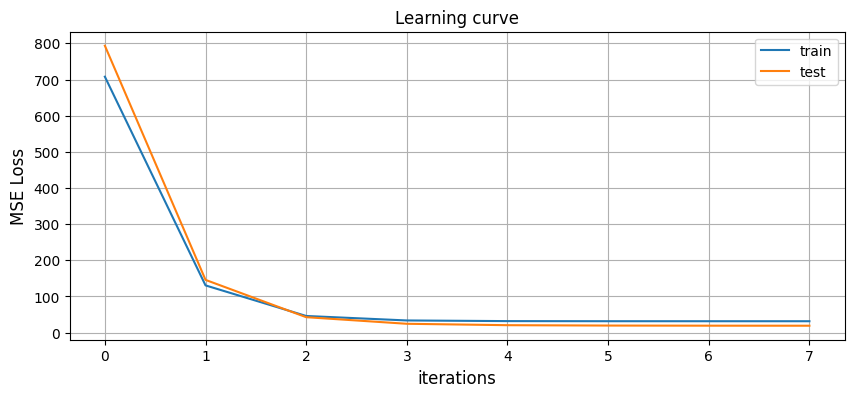

In [ ]:
plot_mse(mse_train, mse_test)

Видно, что **Loss падает** как на **train**, так и на **test** выборке. Также мы можем сказать, что **сеть обучилась**: train и test **графики вышли на плато**. При этом не произошло **переобучение**: ошибка на **test** выборке **не начала расти** (про переобучение поговорим позже).

В полученных графиках есть особенность, которая бросается в глаза опытному в обучении моделей человеку: **Loss на test выборке меньше, чем на train**. Это показатель того, что **с данными что-то не так**. Так бывает при утечке данных (об утечке данных вы подробнее узнаете в следующих лекциях), но в данном случае, test выборка просто слишком мала, чтобы отражать генеральную совокупность (всего 5 студентов, доверительный интервал для такого маленького количества объектов будет широкий).

## Выбор скорости обучения

**Скорость (шаг) обучения** — некоторый коэффициент, как правило, небольшой, который не позволяет нам двигаться слишком быстро. У нас есть точка, в которую мы хотим попасть. Если мы сделаем слишком большой шаг, то мы ее перескочим (график справа), поэтому надо подобрать шаг, который не позволит ее перескочить, но в то же время такой, чтобы тот же процесс не шел слишком медленно (как на графике слева).

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/learning_rate_optimal_value.png">

Посмотрим на скорость обучения на нашем примере. При **маленькой скорости обучения** мы будем очень медленно сходиться к минимуму.

In [ ]:
slopes, prediction, mse_train, dmse_train, mse_test = gradient_descent(
    x_train[:, 0], y_train, x_test[:, 0], y_test, w=5, alpha=0.0005, iteration=30
)

Iteration 0: w = 5.00, Loss_train = 707.84, Loss_test = 793.54.
Iteration 1: w = 5.14, Loss_train = 707.84, Loss_test = 793.54.
Iteration 2: w = 5.28, Loss_train = 666.74, Loss_test = 748.16.
Iteration 3: w = 5.42, Loss_train = 628.13, Loss_test = 705.49.
Iteration 4: w = 5.55, Loss_train = 591.87, Loss_test = 665.36.
Iteration 5: w = 5.68, Loss_train = 557.82, Loss_test = 627.61.
Iteration 6: w = 5.80, Loss_train = 525.83, Loss_test = 592.12.
Iteration 7: w = 5.92, Loss_train = 495.79, Loss_test = 558.73.
Iteration 8: w = 6.04, Loss_train = 467.57, Loss_test = 527.33.
Iteration 9: w = 6.15, Loss_train = 441.07, Loss_test = 497.79.
Iteration 10: w = 6.26, Loss_train = 416.17, Loss_test = 470.01.
Iteration 11: w = 6.37, Loss_train = 392.79, Loss_test = 443.88.
Iteration 12: w = 6.47, Loss_train = 370.84, Loss_test = 419.29.
Iteration 13: w = 6.57, Loss_train = 350.21, Loss_test = 396.16.
Iteration 14: w = 6.66, Loss_train = 330.84, Loss_test = 374.40.
Iteration 15: w = 6.76, Loss_train 

In [ ]:
plot_gradient_descent(x_train[:, 0], y_train, slopes, prediction, mse_train, dmse_train)

Спустя 30 итераций оранжевая прямая плохо отражает генеральную совокупность. Мы не достигли минимума MSE и нуля градиента.

Посмотрим, как выглядят кривые обучения:

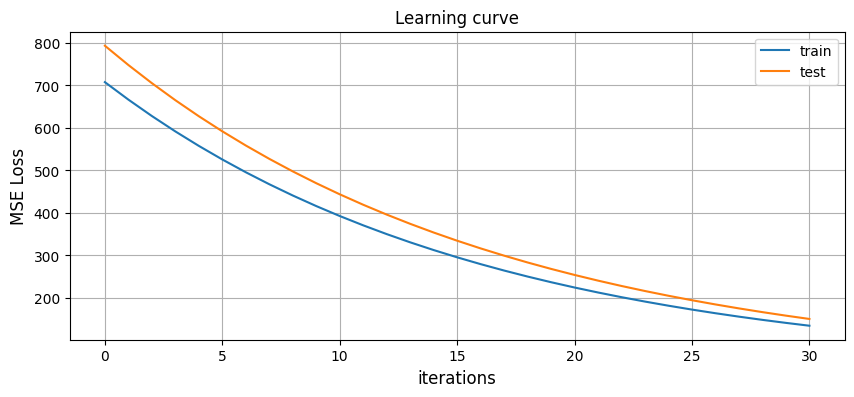

In [ ]:
plot_mse(mse_train, mse_test)

Модель недообучена — значения Loss не вышли на плато.

Посмотрим на **достаточно большую скорость обучения**.

In [ ]:
slopes, prediction, mse_train, dmse_train, mse_test = gradient_descent(
    x_train[:, 0], y_train, x_test[:, 0], y_test, w=5, alpha=0.027, iteration=15
)

Iteration 0: w = 5.00, Loss_train = 707.84, Loss_test = 793.54.
Iteration 1: w = 12.80, Loss_train = 707.84, Loss_test = 793.54.
Iteration 2: w = 7.60, Loss_train = 331.92, Loss_test = 300.22.
Iteration 3: w = 11.07, Loss_train = 164.92, Loss_test = 185.76.
Iteration 4: w = 8.76, Loss_train = 90.74, Loss_test = 65.14.
Iteration 5: w = 10.30, Loss_train = 57.79, Loss_test = 58.06.
Iteration 6: w = 9.27, Loss_train = 43.15, Loss_test = 23.93.
Iteration 7: w = 9.96, Loss_train = 36.65, Loss_test = 29.42.
Iteration 8: w = 9.50, Loss_train = 33.76, Loss_test = 18.09.
Iteration 9: w = 9.80, Loss_train = 32.48, Loss_test = 22.24.
Iteration 10: w = 9.60, Loss_train = 31.91, Loss_test = 17.96.
Iteration 11: w = 9.74, Loss_train = 31.66, Loss_test = 20.14.
Iteration 12: w = 9.65, Loss_train = 31.54, Loss_test = 18.39.
Iteration 13: w = 9.71, Loss_train = 31.49, Loss_test = 19.42.
Iteration 14: w = 9.67, Loss_train = 31.47, Loss_test = 18.67.
Iteration 15: w = 9.69, Loss_train = 31.46, Loss_test 

In [ ]:
plot_gradient_descent(x_train[:, 0], y_train, slopes, prediction, mse_train, dmse_train)

Шаг, получаемый умножением градиента на скорость обучения, получается достаточно большим, чтобы “перескочить” локальный минимум, но при этом модель все-таки попадает в него. Кривые обучения при этом успешно выходят на плато.

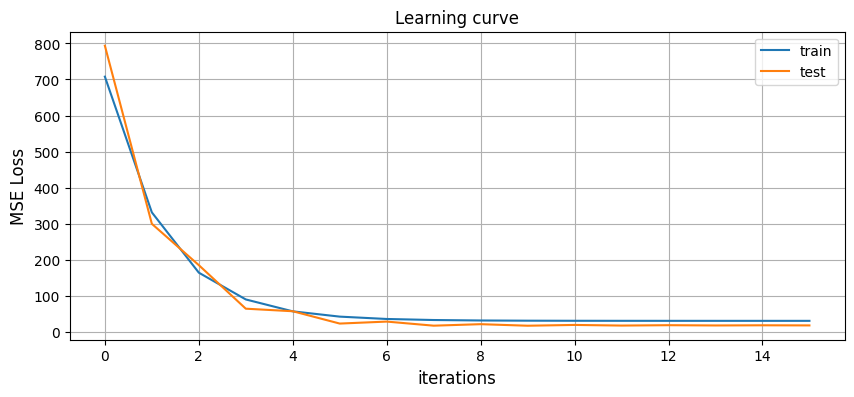

In [ ]:
plot_mse(mse_train, mse_test)

В финале посмотрим на **очень большую скорость обучения**.

In [ ]:
slopes, prediction, mse_train, dmse_train, mse_test = gradient_descent(
    x_train[:, 0],
    y_train,
    x_test[:, 0],
    y_test,
    w=5,
    alpha=0.034,
    iteration=5,
)

Iteration 0: w = 5.00, Loss_train = 707.84, Loss_test = 793.54.
Iteration 1: w = 14.82, Loss_train = 707.84, Loss_test = 793.54.
Iteration 2: w = 4.03, Loss_train = 847.72, Loss_test = 823.37.
Iteration 3: w = 15.89, Loss_train = 1016.53, Loss_test = 1132.95.
Iteration 4: w = 2.86, Loss_train = 1220.26, Loss_test = 1206.01.
Iteration 5: w = 17.17, Loss_train = 1466.11, Loss_test = 1624.33.


Шаг, который мы делаем, слишком большой. Мы не попадаем в локальный минимум.

In [ ]:
plot_gradient_descent(x_train[:, 0], y_train, slopes, prediction, mse_train, dmse_train)


По кривым обучения видно, что модель не сошлась: ошибка растет.


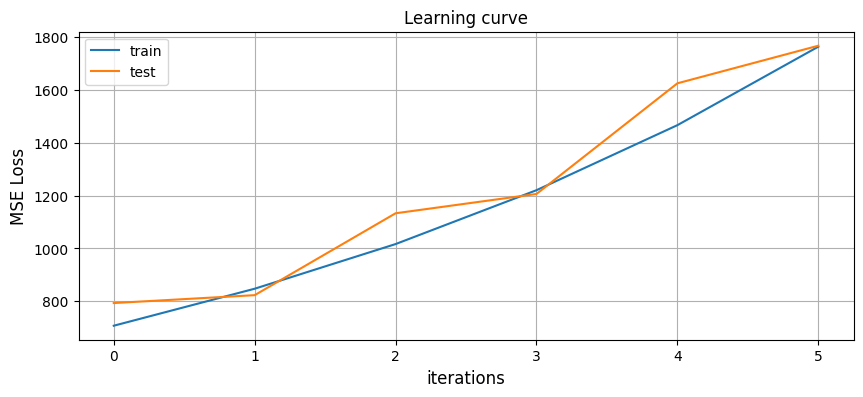

In [ ]:
plot_mse(mse_train, mse_test)

Выбор скорости обучения будет зависеть от модели и данных. В 7 лекции вы познакомитесь с различными модификациями метода градиентного спуска и узнаете больше о выборе скорости обучения, а пока ориентируйтесь на кривые обучения.

## Единый подход к учету смещения

Пока мы настраивали только одну переменную, но даже в случае предсказания оценки по времени подготовки у нас две переменные: вес $w$ и смещение $b$.

Когда признаков станет больше, у нас получится “лапша” из слагаемых:
$$y = b + w_1\cdot x_1 + w_2\cdot x_2 + w_3\cdot x_3 + w_4\cdot x_4 + w_5\cdot x_5 + ... + w_n\cdot x_n$$

Нам бы хотелось записать их компактно, чтобы не усложнять код и использовать один и тот же код для данных с разным количеством признаков.  Для этого мы будем использовать матричное перемножение и трюк **“столбец единиц”**, который реализует **единый подход к учету смещения**.

Обозначим вектор-столбец из настраиваемых параметров:
$$\vec w = \begin{bmatrix}
b \\ w \\
\end{bmatrix}$$


In [ ]:
w = np.array([[0.5], [5]])
w

array([[0.5],
       [5. ]])

К матрице (в нашем случае был только один признак, поэтому у нас будет вектор-столбец) признаков слева "дорисуем" столбец единиц:
$$X = \begin{bmatrix}
1 & X \\
\end{bmatrix} =
\begin{bmatrix}
1 & 2.7 \\
1 & 3.3 \\
... & ...\\
1 & 9.2 \\
\end{bmatrix}$$

**Предупреждение:** добавлять столбец единиц нужно, только если вы сами пишете модель. **Если вы пользуетесь готовыми моделями, в этом нет необходимости.**


In [ ]:
x_train = np.hstack((np.ones((x_train.shape[0], 1)), x_train))
x_test = np.hstack((np.ones((x_test.shape[0], 1)), x_test))
x_test

array([[1. , 8.3],
       [1. , 2.5],
       [1. , 2.5],
       [1. , 6.9],
       [1. , 5.9]])

Матрицу $X$ можно матрично перемножить со столбцом $\vec w$, т.к количество столбцов $X$ совпадает с количеством строк в $\vec w$:

In [ ]:
x_train.shape, w.shape

((20, 2), (2, 1))

В общем случае:

$$\large \vec y = b + w_1\cdot x_1 + w_2\cdot x_2 + w_3\cdot x_3 + w_4\cdot x_4 + w_5\cdot x_5 + ... + w_n\cdot x_n = X\vec w $$  

Эту формулу можно свести к нескольким символам кода (`@` — матричное умножение):


In [ ]:
y_pred = x_test @ w
y_pred

array([[42.],
       [13.],
       [13.],
       [35.],
       [30.]])

## Необходимость нормализации

Реализуем многомерный градиентный спуск

In [ ]:
y_train = np.expand_dims(y_train, axis=1)
y_test = np.expand_dims(y_test, axis=1)

In [ ]:
def gradient(x, y, w):
    """Gradient of mean squared error."""
    return 2 * (x.T @ (x @ w) - x.T @ y) / len(x)


def gradient_descent(x_train, y_train, x_test, y_test, w, alpha, iteration=10):
    """Gradient descent for optimizing slope in simple linear regression"""
    # history
    ws = np.zeros((iteration + 1, 2))
    ws[0] = w[:, 0]
    mse_train = [mean_squared_error(y_train, x_train @ w)]
    dmse_train = []
    mse_test = [mean_squared_error(y_test, x_test @ w)]
    prediction = {(w[0][0], w[1][0]): x_train @ w}

    print(
        f"Iteration 0: b = {w[0][0]:.2f}, w = {w[1][0]:.2f}, "
        f"Loss_train = {mse_train[0]:.2f}, "
        f"Loss_test = {mse_test[0]:.2f}."
    )

    for i in range(iteration):
        # adjust w based on gradient * learning rate
        grad = gradient(x_train, y_train, w)
        w -= alpha * grad  # adjust w based on gradient * learning rate
        # history
        ws[i + 1] = w[:, 0]
        mse_train.append(mean_squared_error(y_train, x_train @ w))
        dmse_train.append(grad)
        mse_test.append(mean_squared_error(y_test, x_test @ w))
        prediction[(w[0][0], w[1][0])] = x_train @ w

        print(
            f"Iteration {i+1}: b = {w[0][0]:.2f}, w = {w[1][0]:.2f}, "
            f"Loss_train = {mse_train[i]:.2f}, "
            f"Loss_test = {mse_test[i]:3.2f}."
        )
    return ws, prediction, mse_train, dmse_train, mse_test

Попробуем обучить модель:

In [ ]:
w = np.array([[0.5], [5]])
ws, prediction, mse_train, dmse_train, mse_test = gradient_descent(
    x_train,
    y_train,
    x_test,
    y_test,
    w,
    0.01,
)

Iteration 0: b = 0.50, w = 5.00, Loss_train = 821.48, Loss_test = 915.80.
Iteration 1: b = 1.01, w = 8.12, Loss_train = 821.48, Loss_test = 915.80.
Iteration 2: b = 1.20, w = 9.26, Loss_train = 138.11, Loss_test = 152.87.
Iteration 3: b = 1.28, w = 9.68, Loss_train = 46.20, Loss_test = 41.48.
Iteration 4: b = 1.31, w = 9.84, Loss_train = 33.84, Loss_test = 23.27.
Iteration 5: b = 1.32, w = 9.89, Loss_train = 32.17, Loss_test = 19.64.
Iteration 6: b = 1.33, w = 9.91, Loss_train = 31.95, Loss_test = 18.72.
Iteration 7: b = 1.34, w = 9.92, Loss_train = 31.91, Loss_test = 18.44.
Iteration 8: b = 1.34, w = 9.92, Loss_train = 31.90, Loss_test = 18.35.
Iteration 9: b = 1.35, w = 9.92, Loss_train = 31.90, Loss_test = 18.31.
Iteration 10: b = 1.36, w = 9.92, Loss_train = 31.90, Loss_test = 18.30.


Мы не дошли до оптимальной прямой $y = 9.68x+2.83$, которую вычисляли выше.

При этом график Loss выглядит неплохо:

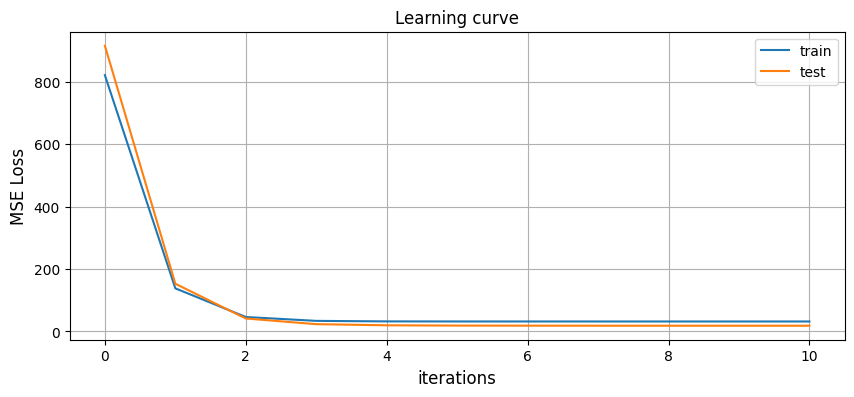

In [ ]:
plot_mse(mse_train, mse_test)

Такое поведение связано с ландшафтом функции потерь: значение ошибки по оси $b$ изменяется намного медленнее, чем по оси $w$.

In [ ]:
from interactive_visualization import plot_grid_search_2d

intercepts = np.arange(-7.5, 12.5, 0.1)  # b
slopes = np.arange(5, 15, 0.1)  # w
plot_grid_search_2d(x_train[:, 1], y_train, slopes, intercepts)

Поэтому основное изменение значений происходит вдоль оси $w$, а $b$ меняется слабо (значение $b$ далеко от ожидаемого).

In [ ]:
from interactive_visualization import plot_gradient_descent_2d

plot_gradient_descent_2d(
    x_train[:, 1],
    y_train[:, 0],
    ws,
    slopes,
    intercepts,
)

Чтобы исправить ситуацию, применим `StandardScaler`:

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

x_train_scaled = scaler.fit_transform(np.expand_dims(x_train[:, 1], axis=1)).flatten()
x_test_scaled = scaler.transform(np.expand_dims(x_test[:, 1], axis=1)).flatten()

In [ ]:
intercepts = np.arange(40, 60, 0.1)  # b
slopes = np.arange(15, 35, 0.1)  # w

plot_grid_search_2d(x_train_scaled, y_train, slopes, intercepts)

In [ ]:
x_train_scaled = np.hstack(
    (np.ones((len(x_train_scaled), 1)), np.expand_dims(x_train_scaled, axis=1)),
)

x_test_scaled = np.hstack(
    (np.ones((len(x_test_scaled), 1)), np.expand_dims(x_test_scaled, axis=1)),
)

Т.к. диапазоны $x$ изменились, значения $w$ и $b$ тоже изменятся.


In [ ]:
w = np.array([[57.0], [33.0]])
ws, prediction, mse_train, dmse_train, mse_test = gradient_descent(
    x_train_scaled, y_train, x_test_scaled, y_test, w, 0.35, iteration=10
)

Iteration 0: b = 57.00, w = 33.00, Loss_train = 146.31, Loss_test = 108.53.
Iteration 1: b = 52.70, w = 26.86, Loss_train = 146.31, Loss_test = 108.53.
Iteration 2: b = 51.40, w = 25.01, Loss_train = 41.79, Loss_test = 21.10.
Iteration 3: b = 51.02, w = 24.46, Loss_train = 32.39, Loss_test = 17.36.
Iteration 4: b = 50.90, w = 24.29, Loss_train = 31.54, Loss_test = 18.27.
Iteration 5: b = 50.86, w = 24.24, Loss_train = 31.46, Loss_test = 18.72.
Iteration 6: b = 50.85, w = 24.23, Loss_train = 31.46, Loss_test = 18.88.
Iteration 7: b = 50.85, w = 24.23, Loss_train = 31.45, Loss_test = 18.92.
Iteration 8: b = 50.85, w = 24.22, Loss_train = 31.45, Loss_test = 18.94.
Iteration 9: b = 50.85, w = 24.22, Loss_train = 31.45, Loss_test = 18.94.
Iteration 10: b = 50.85, w = 24.22, Loss_train = 31.45, Loss_test = 18.94.


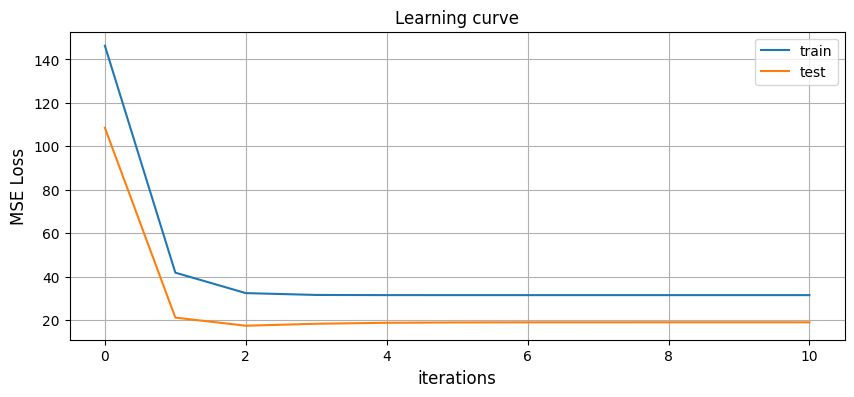

In [ ]:
plot_mse(mse_train, mse_test)

Проверим, что после нормализации мы сходимся к $y = 9.68x + 2.83$.  Для этого используем данные о матожидании и дисперсии из `StandardScaler`.

In [ ]:
b = ws[-1][0] - ws[-1][1] * scaler.mean_ / (scaler.var_) ** 0.5
w = ws[-1][1] / (scaler.var_) ** 0.5

print(f"y = {w[0]:.2f}x + {b[0]:.2f}")

y = 9.68x + 2.83


По визуализации видно, что $w$ и $b$ изменяются во время обучения.

In [ ]:
plot_gradient_descent_2d(
    x_train_scaled[:, 1],
    y_train[:, 0],
    ws,
    slopes,
    intercepts,
)

## Cтохастический градиентный спуск

[[blog] ✏️ Пост о стохастическом градиентом спуске](https://www.tomasbeuzen.com/deep-learning-with-pytorch/chapters/chapter2_stochastic-gradient-descent.html)

До этого мы обучали модель, рассчитывая градиент по **всей train выборке**. Это не всегда возможно:
- данных может быть слишком много, чтобы загрузить их в память одновременно и рассчитать градиент,
- мы можем хотеть дообучать модель на свежепришедших данных, которых может быть немного.


Поэтому появляется идея **стохастического градиентного спуска**: мы можем делать шаг обучения, рассчитывая градиент не по всей выборке (**batch**), а по нескольким случайно выбранным объектам (**mini-batch**) или даже по одному случайно выбранному объекту (**stochastic**).

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/define_size_of_batch.png" width="500"></center>

Можно [показать 📚[book]](https://academy.yandex.ru/handbook/ml/article/shodimost-sgd), что **стохастический** (с размером $\text{batch}=1$) **градиентный спуск сходится к минимуму (глобальному или локальному) функции потерь** с конечной точностью. Важным условием является **стохастичность**. Если мы будем использовать одну и ту же последовательность выборок, это приведет к накоплению ошибки и смещению результата.

Добавим создание подвыборки к нашему алгоритму:

In [ ]:
def stochastic_gradient_descent(
    x_train,
    y_train,
    x_test,
    y_test,
    w,
    alpha,
    iteration=10,
    batch_size=None,
):
    """Gradient descent for optimizing slope in simple linear regression"""
    # history
    ws = np.zeros((iteration + 1, 2))
    ws[0] = w[:, 0]
    mse_train = [mean_squared_error(y_train, x_train @ w)]
    dmse_train = []
    mse_test = [mean_squared_error(y_test, x_test @ w)]
    prediction = {(w[0][0], w[1][0]): x_train @ w}

    print(
        f"Iteration 0: b = {w[0][0]:.2f}, w = {w[1][0]:.2f}, "
        f"Loss_train = {mse_train[0]:.2f}, "
        f"Loss_test = {mse_test[0]:.2f}."
    )

    for i in range(iteration):
        if not batch_size:
            x_sample = x_train
            y_sample = y_train
        else:
            indxs = np.random.choice(x_train.shape[0], batch_size)
            x_sample = x_train[indxs, :]
            y_sample = y_train[indxs, :]

        # adjust w based on gradient * learning rate
        grad = gradient(x_sample, y_sample, w)
        w -= alpha * grad  # adjust w based on gradient * learning rate
        # history
        ws[i + 1] = w[:, 0]
        mse_train.append(mean_squared_error(y_train, x_train @ w))
        dmse_train.append(grad)
        mse_test.append(mean_squared_error(y_test, x_test @ w))
        prediction[(w[0][0], w[1][0])] = x_train @ w
        if (i + 1) % 10 == 0:
            print(
                f"Iteration {i+1}: b = {w[0][0]:.2f}, w = {w[1][0]:.2f}, "
                f"Loss_train = {mse_train[i]:.2f}, "
                f"Loss_test = {mse_test[i]:3.2f}."
            )
    return ws, prediction, mse_train, dmse_train, mse_test

Чтобы сравнить результаты, будем использовать одни и те же количество итераций и скорость обучения. Чтобы компенсировать стохастичность, возьмем маленькое значение $\alpha$ и $100$ итераций.

Для всего train сета мы посчитаем градиент для $20\cdot100 = 2000$ точек.

In [ ]:
w = np.array([[57.0], [33.0]])
ws, prediction, mse_train, dmse_train, mse_test = stochastic_gradient_descent(
    x_train_scaled,
    y_train,
    x_test_scaled,
    y_test,
    w,
    0.02,
    iteration=100,
    batch_size=None,
)

f1 = plot_gradient_descent_2d(
    x_train_scaled[:, 1],
    y_train[:, 0],
    ws,
    slopes,
    intercepts,
    mode="lines",
    title="Batch gradient descent",
)

Iteration 0: b = 57.00, w = 33.00, Loss_train = 146.31, Loss_test = 108.53.
Iteration 10: b = 54.94, w = 30.06, Loss_train = 86.54, Loss_test = 55.92.
Iteration 20: b = 53.57, w = 28.10, Loss_train = 55.80, Loss_test = 30.94.
Iteration 30: b = 52.66, w = 26.80, Loss_train = 42.22, Loss_test = 21.36.
Iteration 40: b = 52.05, w = 25.94, Loss_train = 36.21, Loss_test = 18.09.
Iteration 50: b = 51.65, w = 25.36, Loss_train = 33.56, Loss_test = 17.29.
Iteration 60: b = 51.38, w = 24.98, Loss_train = 32.38, Loss_test = 17.36.
Iteration 70: b = 51.20, w = 24.73, Loss_train = 31.87, Loss_test = 17.68.
Iteration 80: b = 51.08, w = 24.56, Loss_train = 31.64, Loss_test = 18.01.
Iteration 90: b = 51.01, w = 24.45, Loss_train = 31.54, Loss_test = 18.28.
Iteration 100: b = 50.95, w = 24.37, Loss_train = 31.49, Loss_test = 18.49.


Для стохастического градиентного спуска (размер $\text{batch}=1$) мы посчитаем градиент для $1\cdot100 = 100$ точек.

In [ ]:
np.random.seed(42)
w = np.array([[57.0], [33.0]])
ws_stohastic, prediction, mse_train, dmse_train, mse_test = stochastic_gradient_descent(
    x_train_scaled,
    y_train,
    x_test_scaled,
    y_test,
    w,
    0.02,
    iteration=100,
    batch_size=1,
)
f2 = plot_gradient_descent_2d(
    x_train_scaled[:, 1],
    y_train[:, 0],
    ws_stohastic,
    slopes,
    intercepts,
    mode="lines",
    title="Stochastic gradient descent",
)

Iteration 0: b = 57.00, w = 33.00, Loss_train = 146.31, Loss_test = 108.53.
Iteration 10: b = 54.17, w = 29.83, Loss_train = 74.29, Loss_test = 45.31.
Iteration 20: b = 54.43, w = 28.49, Loss_train = 62.91, Loss_test = 37.09.
Iteration 30: b = 52.67, w = 26.34, Loss_train = 42.71, Loss_test = 22.04.
Iteration 40: b = 51.48, w = 23.96, Loss_train = 32.13, Loss_test = 18.45.
Iteration 50: b = 52.13, w = 25.01, Loss_train = 33.79, Loss_test = 17.58.
Iteration 60: b = 51.83, w = 25.15, Loss_train = 33.67, Loss_test = 17.93.
Iteration 70: b = 52.79, w = 25.67, Loss_train = 37.54, Loss_test = 19.11.
Iteration 80: b = 51.72, w = 24.74, Loss_train = 32.47, Loss_test = 17.52.
Iteration 90: b = 51.25, w = 25.29, Loss_train = 32.72, Loss_test = 17.30.
Iteration 100: b = 50.82, w = 24.18, Loss_train = 31.49, Loss_test = 18.89.


Для стохастического спуска с $\text{mini-batch}=5$ мы посчитаем градиент для $5\cdot100=500$ точек.

In [ ]:
np.random.seed(42)
w = np.array([[57.0], [33.0]])
(
    ws_mini_batch,
    prediction,
    mse_train,
    dmse_train,
    mse_test,
) = stochastic_gradient_descent(
    x_train_scaled,
    y_train,
    x_test_scaled,
    y_test,
    w,
    0.02,
    iteration=100,
    batch_size=5,
)
f3 = plot_gradient_descent_2d(
    x_train_scaled[:, 1],
    y_train[:, 0],
    ws_mini_batch,
    slopes,
    intercepts,
    mode="lines",
    title="Mini-batch gradient descent",
)

Iteration 0: b = 57.00, w = 33.00, Loss_train = 146.31, Loss_test = 108.53.
Iteration 10: b = 54.89, w = 29.67, Loss_train = 79.49, Loss_test = 50.29.
Iteration 20: b = 53.54, w = 27.93, Loss_train = 52.77, Loss_test = 28.57.
Iteration 30: b = 52.28, w = 26.91, Loss_train = 42.28, Loss_test = 21.22.
Iteration 40: b = 51.72, w = 25.83, Loss_train = 35.69, Loss_test = 17.80.
Iteration 50: b = 51.10, w = 24.92, Loss_train = 32.10, Loss_test = 17.53.
Iteration 60: b = 50.84, w = 24.91, Loss_train = 32.06, Loss_test = 17.59.
Iteration 70: b = 51.04, w = 24.98, Loss_train = 32.12, Loss_test = 17.46.
Iteration 80: b = 51.28, w = 24.72, Loss_train = 31.93, Loss_test = 17.63.
Iteration 90: b = 51.03, w = 24.41, Loss_train = 31.56, Loss_test = 18.33.
Iteration 100: b = 50.85, w = 23.98, Loss_train = 31.48, Loss_test = 19.36.


Мы ищем минимум для всех данных.
- Градиент, рассчитанный по одному объекту, будет специфичен. Трек обучения  в случае стохастического градиентного спуска будет запутанным, а итоговая ошибка будет расти с увеличением скорости обучения (мы взяли низкую скорость).
- Градиент, рассчитанный по нескольким объектам будет давать лучшую оценку градиента для всех данных. Трек будет менее сложным.
- Градиент, рассчитанный по всей выборке, будет давать наиболее точное направление.

In [ ]:
from interactive_visualization import plot_panel

plot_panel(f1, f2, f3)

Для **ускорения расчетов** рекомендовано использовать **максимальный размер mini-batch**, который помещается в память, но это не всегда дает лучший результат. На 7 лекции вы увидите, что для сложных моделей стохастичность, связанная с небольшим размером батча, может помочь выбраться из локального минимума и найти более глубокий.


# Основанный на расстоянии подход в задаче линейной классификации

## Постановка задачи

Теперь попробуем разобраться, что делать в случае классификации.

Рассмотрим задачу классификации на два класса. Например, у нас есть данные о лабораторных мышах. Часть из них имеет нормальную массу тела, а часть — мыши с ожирением.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/svm_mouse_example.png" width="800">

Итак:
1. У нас есть набор данных из $N$ объектов (мышей).
2. Для каждого из объектов (мышей) нам известно признаковое описание объекта в виде набора вещественных чисел (вес, длина от носа до кончика хвоста, возраст и т.д.). То есть объекту под номером $i$ соответствует вектор $\vec x_i$.
3. Также для каждого объекта нам известна истинная метка класса. Мы знаем, что объекту с признаковым описанием $\vec x_i$ соответствует метка класса $y_i$. Будем считать, что метки классов принимают значения:
$$y_i =
\begin{cases}
    +1, & \text{для пухляшей}, \\
    -1, & \text{для всех остальных}.
\end{cases}$$

##1D классификация

Рассмотрим **одномерный пример**. У нас есть данные только по **массе мышей**. Часть из них определена как мыши с нормальной массой тела, а часть — как мыши с ожирением.

Чтобы их отделить друг от друга, нам достаточно одного критерия. Мы можем посмотреть на график и визуально определить предельную массу, после которой мыши считаются мышами с ожирением.

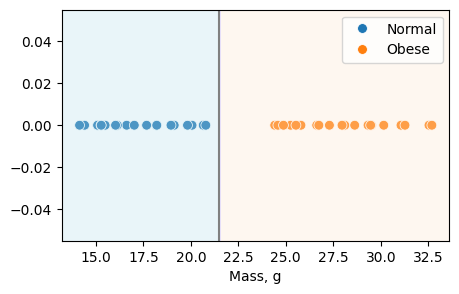

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap


custom_cmap = ListedColormap(["#B8E1EC", "#bea6ff", "#FEE7D0"])


def generate_data(total_len=40):
    x = np.hstack(
        [
            np.random.uniform(14, 21, total_len // 2),
            np.random.uniform(24, 33, total_len // 2),
        ]
    )
    y = np.hstack([np.zeros(total_len // 2), np.ones(total_len // 2)])
    return x, y


def plot_data_1d(
    x,
    y,
    total_len=40,
    s=50,
    threshold=None,
    margin=None,
    legend=["Normal", "Obese"],
    marker="o",
):
    ax = sns.scatterplot(x=x, y=np.zeros(len(x)), hue=y, s=s, marker=marker)
    if threshold:
        x_lim, y_lim = ax.get_xlim(), ax.get_ylim()
        XX, YY = np.meshgrid(
            np.linspace(x_lim[0], x_lim[1], 100), np.linspace(y_lim[0], y_lim[1], 100)
        )
        pred = np.sign(XX - threshold)
        plt.contourf(XX, YY, pred, alpha=0.3, cmap=custom_cmap)
        ax.axvline(threshold, color="grey")
    if margin:
        for line in margin:
            ax.axvline(line, color="grey", ls="dashed")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, legend)
    ax.set(xlabel="Mass, g")
    return ax


total_len = 40
np.random.seed(42)
x, y = generate_data(total_len=total_len)
plt.figure(figsize=(5, 3))
ax = plot_data_1d(x, y, threshold=21.5, total_len=total_len)

Теперь, пользуясь нашим простым критерием, попробуем классифицировать каких-то новых (тестовых) мышей $\color{orange}{✭}$ $\color{blue}{✭}$:

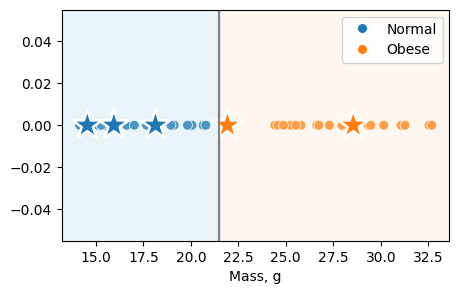

In [ ]:
x_test = np.random.uniform(14, 30, 5)


def classify(x, threshold=21.5):
    y = np.zeros_like(x)
    y[x > threshold] = 1
    return y


total_len = 40
threshold = 21.5

plt.figure(figsize=(5, 3))
ax = plot_data_1d(x, y, threshold=threshold, total_len=total_len)
ax = plot_data_1d(
    x_test, classify(x_test, threshold), total_len=total_len, s=500, marker="*"
)

Одна из тестовых мышей была классифицирована как мышь с ожирением ($\color{orange}{✭}$ на границе), хотя она ближе по массе к мышам без ожирения из обучающей выборки $\color{blue}{●}$. Не порядок!

## Maximum Margin Classifier

Вооружившись этим новым знанием, попробуем классифицировать мышек по-умному. Возьмем крайние точки в каждом кластере. И в качестве порогового значения будем использовать среднее между ними.

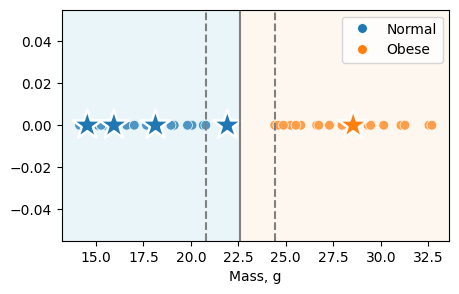

In [ ]:
normal_limit = x[y == 0].max()  # extreme point for 'normal'
obese_limit = x[y == 1].min()  # extreme point for 'obese'

threshold = np.mean([normal_limit, obese_limit])  # separated with mean value

plt.figure(figsize=(5, 3))
ax = plot_data_1d(
    x, y, total_len=total_len, threshold=threshold, margin=[normal_limit, obese_limit]
)
ax = plot_data_1d(
    x_test,
    classify(x_test, threshold=threshold),
    total_len=total_len,
    s=500,
    marker="*",
)

Мы можем посчитать, насколько наша мышь близка к тому, чтобы оказаться в другом классе. Такое расстояние называется **margin**. И оно считается как $\mathrm{margin} = |\mathrm{threshold} - \mathrm{observation}|$.

In [ ]:
margins = np.abs(x_test - threshold)
print(margins)

[6.65109958 0.68088078 8.053495   5.94541509 4.46323163]


Соответственно, если мы посчитаем margins для наших крайних точек `normal_limit` и `obese_limit`, мы найдем самое большое возможное значение margin для нашего классификатора:

In [ ]:
margin_0 = np.abs(normal_limit - threshold)
margin_1 = np.abs(obese_limit - threshold)
print(margin_0, margin_1)

1.8143423746730107 1.8143423746730072


Такой классификатор мы называем **Maximum Margin Classifier**. Он хорошо работает в случае, когда классы не пересекаются.

## 2D классификация

Теперь рассмотрим пример, где мы измерили не только вес мышей, но и их длину от хвоста до носа. Теперь не очевидно, какие точки кластеров у нас являются крайними и как провести разделяющую прямую, чтобы классы были максимально разнесены.

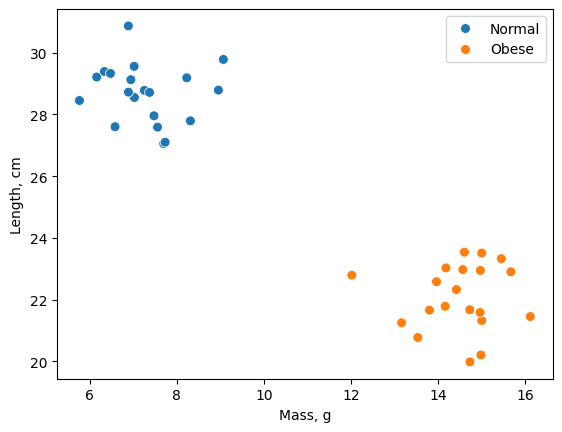

In [ ]:
from sklearn.datasets import make_blobs


def generate_2d_data(total_len=40):
    x, y = make_blobs(n_samples=total_len, centers=2, random_state=42)
    x[:, 0] += 10
    x[:, 1] += 20
    return x, y


total_len = 40
x, y = generate_2d_data(total_len=total_len)

fig = plt.figure()
ax = sns.scatterplot(x=x[:, 0], y=x[:, 1], hue=y, s=50)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ["Normal", "Obese"])
ax.set(xlabel="Mass, g", ylabel="Length, cm")
plt.show()

## SVM: метод множителей Лагранжа

**Идея:** Мы умеем решать задачу классификации в одномерном случае. В многомерном случае попробуем свести задачу к одномерной. Для этого мы будем подбирать вектор весов и смещение чтобы точки преобразовывались, как на картинке:

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/svm_hard_margin.png" width="1000">

Подобрать такое преобразование в многомерной задаче — значит провести **разделяющую гиперплоскость** так, чтобы:
1. **Плюсы и минусы** лежали **по разные** стороны от этой плоскости.
2. **Ближайшие** к плоскости **объекты** были от нее как можно **дальше**.



**Гиперплоскость однозначно задается вектором нормали $\vec w$ и смещением $b$.** Мы ищем решение в виде $(\vec w, \vec x) + b$, где $(\vec w, \vec x)$ — это скалярное произведение, $\vec w$ — вектор весов, а $b$ — смещение. Скалярное произведение вектора признаков на вектор нормали будет давать проекцию вектора признаков на вектор нормали (переход к 1d задаче).

Вектора нормали могут быть разной длины. Мы можем нормализовать вектор нормали (сделать длину вектора равной 1). Вместо этого в SVM (support vector machine) принято **фиксировать margin от −1 до 1** (это позволяет удобно записать слагаемое, отвечающее за максимальное удаление объектов от гиперплоскости в качестве слагаемого loss функции).

Вы можете заметить, что **для построения зазора важны не все объекты**, а ограниченное количество объектов, чьи проекции попадают в точки 1 и −1. Такие объекты называются **опорными векторами (support vector)** т.к. в них будет упираться зор между классами.


Итого:
1. Мы хотим подобрать такие $\vec  w$ и $b$, чтобы можно было провести такие гиперплоскости:
$$\large (\vec w, \vec x) + b  = 1$$

- **Лежащие на этой плоскости и выше объекты относятся к классу $+1$:** $\large (\vec w, \vec x_+) + b  \ge 1$

$$\large (\vec w, \vec x) + b  = -1$$

- **Лежащие на этой плоскости и ниже объекты относятся к классу $-1$:** $\large (\vec w, \vec x_-) + b  \le -1$

    Условие того, что  $i$-й объект лежит по правильную сторону от разделяющих поверхностей, можно записать в совместное условие:

    $$\large y_i ((\vec w, \vec x_i) + b )\ge 1,$$

    которое должно выполняться для всех объектов $1 \le i \le N$.

2. Мы хотим разнести эти плоскости как можно дальше. Расстояние между двумя этими **жесткими** границами можно расписать через проекции **опорных** (лежащих на плоскости) **векторов** $\vec x_{sv+}$ (дает проекцию в точку $1$) и $\vec x_{sv1}$ (дает проекцию в точку $-1$):  

$$\text{margin} =\frac{\vec w}{||\vec w||}(\vec x_{sv+} - \vec x_{sv-}) =\frac{(\vec w,\vec x_{sv+})+b-((\vec w,\vec x_{sv-})+b)}{||\vec w||} = \frac{1-(-1)}{||\vec w||} = \frac{2}{||\vec w||}$$

Мы приходим к следующей задаче на экстремум:

$$\max \frac{2}{||\vec w||} \Rightarrow \min \frac{1}{2} ||\vec w||^2$$

при условии:
$$\large y_i ((\vec w, \vec x_i) + b )\ge 1.$$

Задача на условный экстремум для линейно разделимых классов может быть решена аналитически при помощи [метода множителей Лагранжа 📚[wiki]](https://en.wikipedia.org/wiki/Lagrange_multiplier) (позволяет преобразовать задачу условной оптимизации в задачу безусловной оптимизации).

Найти $\alpha_i$, $\vec w$ и $b$, которые реализуют минимум функции потерь:

$$\large L =  \frac{1}{2} ||\vec w||^2 + \sum_i \alpha_i [y_i ((\vec w, \vec x_i) + b) - 1]$$

$\alpha_i\geq0$ — множитель Лагранжа. Он будет не равен нулю только для **опорных векторов**.

Подробный вывод этой формулы:
* [[video] 📺 MIT: Support Vector Machines](https://www.youtube.com/watch?v=_PwhiWxHK8o)

В библиотеке Sklearn минимизация функции $L$ реализована через алгоритм Sequential Minimal Optimization, [предложенный Джоном Платтом в 1998 году 🎓[article]](https://www.microsoft.com/en-us/research/wp-content/uploads/2016/02/tr-98-14.pdf). Он работает очень быстро, потому что разбивает задачу на множество подзадач, решаемых аналитически (подробности в статье).

Применим к мышкам метод `svm` из библиотеки Sklearn.

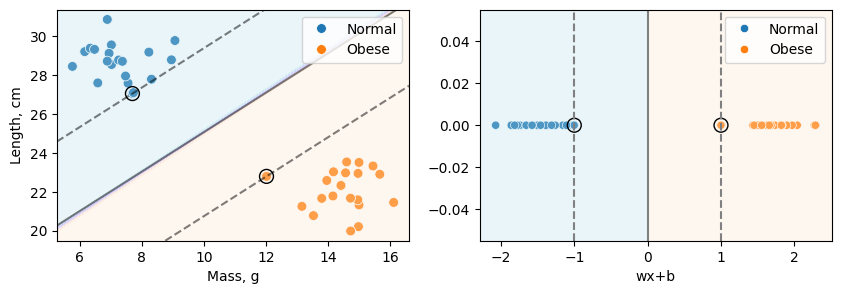

In [ ]:
from sklearn import svm

# Code for illustration, later we will understand how it works
# fit the model, don't regularize for illustration purposes
clf = svm.SVC(kernel="linear", C=1000)
clf.fit(x, y)

fig, axs = plt.subplots(1, 2, figsize=(10, 3))

# first fig
sns.scatterplot(x=x[:, 0], y=x[:, 1], hue=y, s=50, ax=axs[0])
handles, labels = axs[0].get_legend_handles_labels()
axs[0].legend(handles, ["Normal", "Obese"])
axs[0].set(xlabel="Mass, g", ylabel="Length, cm")

# plot the decision function
delta = 0.5
# create grid to evaluate model
YY, XX = np.meshgrid(
    np.linspace(x[:, 1].min() - delta, x[:, 1].max() + delta, 30),
    np.linspace(x[:, 0].min() - delta, x[:, 0].max() + delta, 30),
)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = clf.decision_function(xy).reshape(XX.shape)
pred = np.sign(Z)
axs[0].contourf(XX, YY, pred, alpha=0.3, cmap=custom_cmap)

# plot decision boget_xlimundary and margins
axs[0].contour(
    XX, YY, Z, colors="k", levels=[-1, 0, 1], alpha=0.5, linestyles=["--", "-", "--"]
)
# plot support vectors
axs[0].scatter(
    clf.support_vectors_[:, 0],
    clf.support_vectors_[:, 1],
    s=100,
    linewidth=1,
    facecolors="none",
    edgecolors="k",
)

# second fig
dec_val = clf.decision_function(x)
sns.scatterplot(x=dec_val, y=np.zeros(len(x)), hue=y, ax=axs[1])

x_lim, y_lim = axs[1].get_xlim(), axs[1].get_ylim()
XX, YY = np.meshgrid(
    np.linspace(x_lim[0], x_lim[1], 100), np.linspace(y_lim[0], y_lim[1], 100)
)
pred = np.sign(XX)
axs[1].contourf(XX, YY, pred, alpha=0.3, cmap=custom_cmap)

axs[1].axvline(0, color="grey")
axs[1].axvline(-1, color="grey", ls="dashed")
axs[1].axvline(1, color="grey", ls="dashed")
handles, labels = axs[1].get_legend_handles_labels()
axs[1].legend(handles, ["Normal", "Obese"])
axs[1].set(xlabel="wx+b")

sv = clf.decision_function(clf.support_vectors_)
axs[1].scatter(
    sv, np.zeros_like(sv), s=100, linewidth=1, facecolors="none", edgecolors="k"
)
plt.show()

Альтернативным подходом к решению SVM задачи является Hinge loss с идеей которого можно ознакомиться по ссылке:
* [[colab] 🥨 Hinge loss и accuracy](https://colab.research.google.com/drive/10STVnRISuC7DCJQ3x5XJgKG8gYTRqrSh)

## 3D классификация

Если мы добавим еще одно измерение — возраст, мы обнаружим, что наши данные стали трехмерными, а разделяет их теперь не линия, а плоскость.

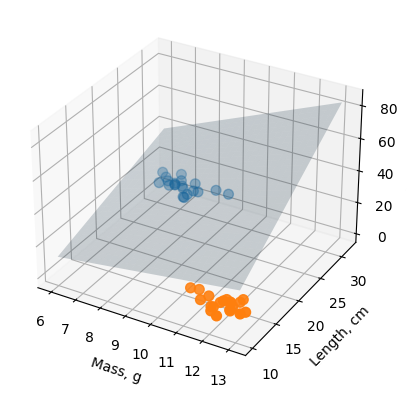

In [ ]:
def generate_3d_data(total_len=40):
    x, y = make_blobs(n_samples=total_len, centers=2, random_state=42, n_features=3)
    x[:, 0] += 10
    x[:, 1] += 20
    x[:, 2] += 10
    return x, y


def plot_data(x, y, total_len=40, s=50, threshold=21.5):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(
        xs=x[:, 0], ys=x[:, 1], zs=x[:, 2], c=y, s=s, cmap="tab10", vmin=0, vmax=9
    )
    # plot the decision function
    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # create grid to evaluate model
    xx = np.linspace(xlim[0], xlim[1], 30)
    yy = np.linspace(ylim[0], ylim[1], 30)
    YY, XX = np.meshgrid(yy, xx)
    ax.plot_surface(XX, YY, XX * YY * 0.2, alpha=0.2)
    handles, labels = ax.get_legend_handles_labels()
    ax.set(xlabel="Mass, g", ylabel="Length, cm", zlabel="Age, days")
    return ax


total_len = 40
x, y = generate_3d_data(total_len=total_len)
ax = plot_data(x, y, total_len=total_len)

Соответственно, если бы у нас было 4 измерения и больше (например: вес, длина, возраст, кровяное давление), то многомерная плоскость, которая бы разделяла наши классы, называлась бы **гиперплоскость** (рисовать мы ее, конечно же, не будем). Чисто технически, и точка, и линия — тоже гиперплоскости. Но все же гиперплоскостью принято называть то, что нельзя нарисовать на бумаге.

## Многоклассовая классификация

Решение задачи SVM, которое мы рассматривали, касалось задачи бинарной классификации. Однако мы часто будем работать с несколькими классами.

Есть две основные стратегии расширения задачи SVM классификации с двух классов на несколько:
* **One vs rest** (один против всех): каждый класс отделяется от всех других одной прямой (гиперплоскостью).
* **One vs one** (один против одного): классы попарно отделяются друг от друга прямыми (гиперплоскостями).

Создадим датасет из 4 классов для демонстрации отличий между этими способами.

In [ ]:
centers = [[1, 1], [1, -1], [-1, -1], [-1, 1]]

x, y = make_blobs(n_samples=300, centers=centers, cluster_std=0.50, random_state=42)

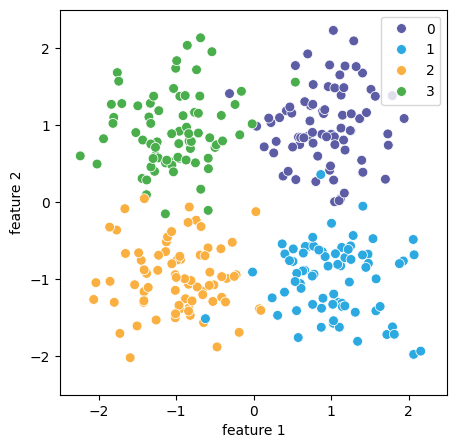

In [ ]:
dark_colors = ["#1B1464", "#0961A5", "#754C24", "#006837"]
bright_colors = ["#5D5DA6", "#2DA9E1", "#F9B041", "#4AAE4D"]
dull_cmap = ListedColormap(["#D1D5ED", "#B8E1EC", "#FEE7D0", "#C9E3C8"])

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

# first fig
sns.scatterplot(
    x=x[:, 0], y=x[:, 1], hue=y, s=50, ax=ax, palette=sns.color_palette(bright_colors)
)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ["0", "1", "2", "3"])
ax.set(xlabel="feature 1", ylabel="feature 2")

plt.xlim([-2.5, 2.5])
plt.ylim([-2.5, 2.5])
plt.show()

### One vs Rest

Классификация **one vs rest** реализована в Sklearn в классе `svm.LinearSVC`:

In [ ]:
clf = svm.LinearSVC()
clf.fit(x, y)

LinearSVC()

Посмотрим, как выглядят разделяющие прямые и нормали к ним для нашей задачи:

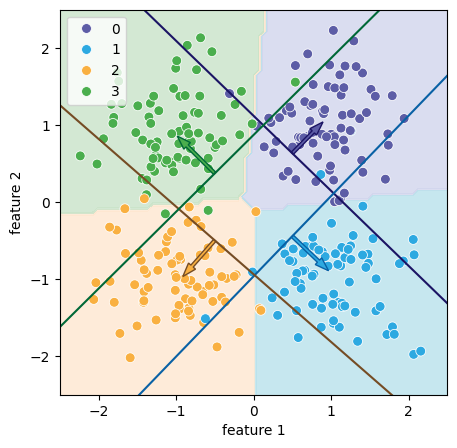

In [ ]:
from sklearn.inspection import DecisionBoundaryDisplay

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

disp = DecisionBoundaryDisplay.from_estimator(
    clf,
    x,
    response_method="predict",
    cmap=dull_cmap,
    alpha=0.8,
    xlabel="feature 1",
    ylabel="feature 2",
    ax=ax,
)

# Plot the training points
sns.scatterplot(
    x=x[:, 0], y=x[:, 1], hue=y, s=50, ax=ax, palette=sns.color_palette(bright_colors)
)

# create grid to evaluate model
xx = np.linspace(-2.5, 2.5)
# for visualization
arrow_xs = [0.5, 0.5, -0.5, -0.5]
for i in range(clf.coef_.shape[0]):
    coef = clf.coef_[i]
    w = -coef[0] / coef[1]
    b = -clf.intercept_[0] / coef[1]
    yy = w * xx + b
    # normal
    plt.arrow(
        arrow_xs[i],
        w * arrow_xs[i] + b,
        coef[0] / 4,
        coef[1] / 4,
        edgecolor=dark_colors[i],
        facecolor=bright_colors[i],
        width=0.04,
    )
    # dividing line
    plt.plot(xx, yy, dark_colors[i])

plt.xlim([-2.5, 2.5])
plt.ylim([-2.5, 2.5])

plt.show()

Коэффициенты `clf.coef_` возвращают вектор нормали. С помощью `clf.coef_` и `clf.intercept_` можно записать уравнение разделяющей прямой.

Для 4 классов стратегия **one vs rest** даст 4 разделяющие прямые (гиперплоскости). Количество разделяющих прямых равно количеству классов.

Стратегия **one vs rest** позволяет обучать меньшее количество классификаторов, чем **one vs one**, но при **большом количестве классов** могут появляться проблемы, связанные с **сильным дисбалансом классов** при решении задачи “один против всех”. При большом количестве классов лучше использовать **one vs one** стратегию.  

### One vs One

Второй стратегией многоклассовой классификации для SVM является **one vs one**, в которой классы разделяются попарно. Эта стратегия реализована в классе `svm.SVC`.

In [ ]:
clf = svm.SVC(kernel="linear")
clf.fit(x, y)

SVC(kernel='linear')

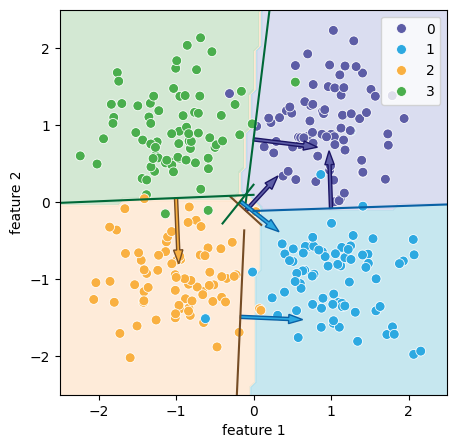

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

disp = DecisionBoundaryDisplay.from_estimator(
    clf,
    x,
    response_method="predict",
    cmap=dull_cmap,
    alpha=0.8,
    xlabel="feature 1",
    ylabel="feature 2",
    ax=ax,
)

# Plot the training points
sns.scatterplot(
    x=x[:, 0], y=x[:, 1], hue=y, s=50, ax=ax, palette=sns.color_palette(bright_colors)
)

# for visualization
arrow_xs = [1, -0.1, 0, -0.17, -0.17, -1]
colors_list = [(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]
range_list = [(0, 2.5), (-0.3, 0.1), (-0.1, 0.5), (-1, -0.12), (-0.4, 0), (-2.5, 0)]

for i in range(clf.coef_.shape[0]):
    xx = np.linspace(*range_list[i])
    coef = clf.coef_[i]
    w = -coef[0] / coef[1]
    b = -clf.intercept_[0] / coef[1]
    yy = w * xx + b
    # normal
    plt.arrow(
        arrow_xs[i],
        w * arrow_xs[i] + b,
        coef[0] / 4,
        coef[1] / 4,
        edgecolor=dark_colors[colors_list[i][0]],
        facecolor=bright_colors[colors_list[i][0]],
        width=0.04,
    )
    # dividing line
    plt.plot(xx, yy, dark_colors[colors_list[i][1]])

plt.xlim([-2.5, 2.5])
plt.ylim([-2.5, 2.5])

plt.show()

Для 4 классов стратегия **one vs one** даст 6 разделяющих прямых (гиперплоскости). Количество разделяющих прямыx:
$$ \frac{n_\text{classes}\cdot (n_\text{classes}-1)}{2},$$
гдe $n_\text{classes}$ — количество классов.

**Практические советы по использованию SVM:**

* SVM делает **геометрическое разделение данных**, поэтому для адекватной работы модели важна **нормализация**.
* В случае **дисбаланса классов** полезно использовать параметры `class_weight` и `sample_weight` ([подробнее 🛠️[doc]](https://scikit-learn.org/stable/modules/svm.html#unbalanced-problems)).
* SVM может давать хорошее решение при небольшом количестве данных, в этом случае стоит попробовать **различные ядра** (про ядра вы узнаете ниже).

# Обобщенные линейные модели

## Полиномиальная модель

Данные не всегда могут быть **хорошо разделены (гипер)плоскостью**. Например, рассмотрим следующее: у нас есть данные по дозировке лекарства и 2 класса — пациенты, которые поправились, и те, которым лучше не стало.

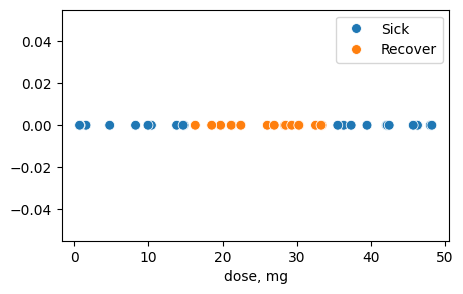

In [ ]:
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt


def generate_patients_data(total_len=40):
    x = np.random.uniform(0, 50, total_len)
    y = np.zeros_like(x)
    y[(x > 15) & (x < 35)] = 1
    return x, y


def plot_data(x, y, total_len=40, s=50):
    plt.figure(figsize=(5, 3))
    ax = sns.scatterplot(x=x, y=np.zeros(len(x)), hue=y, s=s)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, ["Sick", "Recover"])
    ax.set(xlabel="dose, mg")
    return ax


total_len = 40
x, y = generate_patients_data(total_len=total_len)
ax = plot_data(x, y, total_len=total_len)
plt.show()

Соответственно, мы не можем найти такое пороговое значение, которое будет разделять наши классы на больных и здоровых, а, следовательно, и Support Vector Classifier работать тоже не будет.  Для начала давайте преобразуем наши данные таким образом, чтобы они стали 2-хмерными. В качестве значений по оси Y будем использовать дозу, возведенную в квадрат (**доза**$^2$).

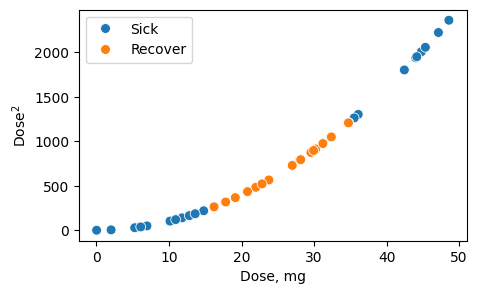

In [ ]:
def plot_data(x, y, total_len=40, s=50):
    plt.figure(figsize=(5, 3))
    ax = sns.scatterplot(x=x[0, :], y=x[1, :], hue=y, s=s)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, ["Sick", "Recover"])
    ax.set(xlabel="Dose, mg")
    ax.set(ylabel="Dose$^2$")
    return ax


total_len = 40
x_1, y = generate_patients_data(total_len=total_len)
x_2 = x_1**2
x = np.vstack([x_1, x_2])

plot_data(x, y, total_len=40, s=50)
plt.show()

Теперь мы можем вновь использовать Support Vector Classifier для классификации.

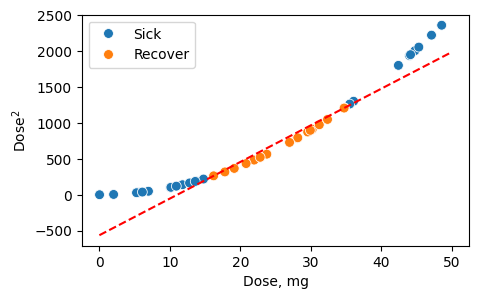

In [ ]:
plot_data(x, y, total_len=40, s=50)

x_arr = np.linspace(0, 50, 50)
xs = [x[0, :][y == 1].min(), x[0, :][y == 1].max()]
ys = [x[1, :][y == 1].min(), x[1, :][y == 1].max()]

# Calculate the coefficients.
coefficients = np.polyfit(xs, ys, 1)

# Let's compute the values of the line...
polynomial = np.poly1d(coefficients)
y_axis = polynomial(x_arr)

# ...and plot the points and the line
plt.plot(x_arr, y_axis, "r--")
plt.show()

## Kernel SVM

Основная идея **Kernel SVM** состоит в том, что **мы можем перейти в пространство большей размерности, в котором данные будут линейно разделимы**.

Но тут возникает резонный вопрос: **почему мы решили возвести в квадрат**? Почему не в куб? Или, наоборот, не извлечь корень? Как нам решить, какое преобразование использовать?

И у нас есть вторая проблема — а если перейти надо в **пространство очень большой размерности**? В этом случае наши данные очень сильно **увеличатся в размере**.

Комбинация двух проблем дает нам много сложности: надо **перебирать большое число возможных пространств большей размерности**.

 ### Обоснование Kernel SVM

Однако основная фишка **Support Vector Machine** состоит в том, что внутри он работает на скалярных произведениях. И можно эти **скалярные произведения** считать, **не переходя в пространство большей размерности**.

Для этого SVM использует **Kernel Function**.

<img src="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/svm_kernel_function.png" width="700">


Выше мы ввели $\text{Loss}$ для **Hard Margin Classifier**:

$$\large \text{Loss} =  \frac{1}{2} ||\vec w||^2 + \sum_i \alpha_i [y_i ((\vec w, \vec x_i) + b) - 1],$$

где $\alpha_i\geq0$ — множитель Лагранжа. Он будет не равен нулю только для **опорных векторов**.

С добавлением некоторых математических ограничений эту формулу можно [переписать ✏️[blog]](https://www.geeksforgeeks.org/dual-support-vector-machine/) в **дуальной форме**:

$$\large \text{Loss} =  \sum_i \alpha_i+ \sum_i \sum_j \alpha_i \alpha_j
y_i y_j (\vec x_i, \vec x_j) = \sum_i \alpha_i+ \sum_i \sum_j \alpha_i \alpha_j
y_i y_j K(\vec x_i, \vec x_j),$$
где $(\vec x_i, \vec x_j)$ — скалярное произведение.

Для получения дуальной формы приравнивают нулю производные $\dfrac {\partial \text{Loss}} {\partial w}$ и $\displaystyle\frac {\partial \text{Loss}}{\partial b}$ и подставляют их в исходную формулу.


В этой формуле можно сделать **kernel trick** — заменить **скалярное произведение** на некоторую функцию от двух векторов, которую мы будем называть **Kernel function**.

Решающее правило в таком случае будет выглядеть как:

$$\large y=f(x)=\text{sign}(\sum_{i=1}^nα_iy_iK(x, x_i)+b),$$

где $x_i$ и $y_i$ — признаки и метки классов опорных векторов.

Важно заметить, что  **дуальная форма** записи для **многоклассовой классификации** возможна только в случае **one vs one**.

### Примеры ядер

Для демонстрации возможностей Kernel SVM создадим датасет, который не разделяется линейными моделями. Для этого воспользуемся функцией `sklearn.datasets.make_circles`.

In [ ]:
from sklearn.datasets import make_circles

x, y = make_circles(n_samples=500, factor=0.3, noise=0.05, random_state=42)

Полученный датасет представляет собой две окружности с разными радиусами и общим центром, относящиеся к разным классам.

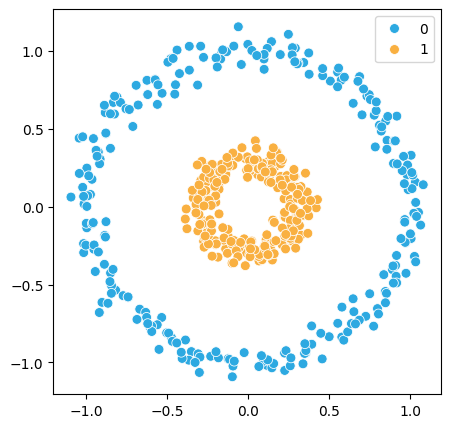

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

sns.scatterplot(
    x=x[:, 0],
    y=x[:, 1],
    hue=y,
    s=50,
    ax=ax,
    palette=sns.color_palette(["#2DA9E1", "#F9B041"]),
)
plt.show()

Напишем функцию визуализации разделяющего правила для SVM модели:

In [ ]:
from matplotlib.colors import ListedColormap
from sklearn.inspection import DecisionBoundaryDisplay


def plot_svm(x, y, clf):
    dull_cmap = ListedColormap(["#B8E1EC", "#FEE7D0"])
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))

    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        x,
        response_method="predict",
        cmap=dull_cmap,
        alpha=0.8,
        xlabel="feature 1",
        ylabel="feature 2",
        ax=ax,
    )

    sns.scatterplot(
        x=x[:, 0],
        y=x[:, 1],
        hue=y,
        s=50,
        ax=ax,
        palette=sns.color_palette(["#2DA9E1", "#F9B041"]),
    )
    plt.show()

Первое ядро, которое мы рассмотрим, линейное. Оно задается формулой:
$$\large K(\vec x_i, \vec x_j) = (\vec x_i, \vec x_j)$$

Линейным ядром является скалярное произведение векторов.

Линейное ядро не способно справиться с такой задачей:

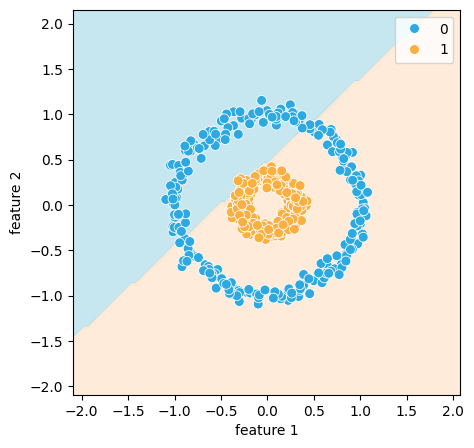

In [ ]:
from sklearn import svm

clf = svm.SVC(kernel="linear")
clf.fit(x, y)
plot_svm(x, y, clf)

Следующее ядро, реализованное в библиотеке Sklearn — полиномиальное, оно задается формулой:
$$K(\vec x_i, \vec x_j) = (\gamma (\vec x_i, \vec x_j)+r)^d,$$
где $d$ — настраиваемый параметр: степень полинома `degree`.

Попробуем применить полиномиальное ядро к нашим данным:

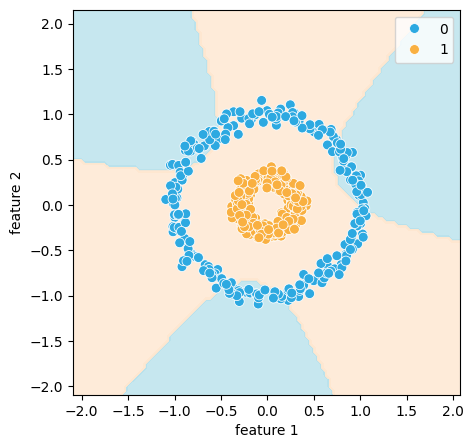

In [ ]:
clf = svm.SVC(kernel="poly")
clf.fit(x, y)
plot_svm(x, y, clf)

Полиномиальное ядро действует не совсем как полиномиальная модель.
У модели не получилось разделить данные. Это связано с тем, что значение `degree` по умолчанию равно 3, поставим степень полинома 2:

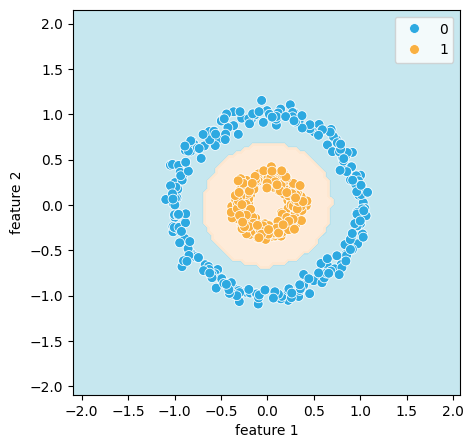

In [ ]:
clf = svm.SVC(kernel="poly", degree=2)
clf.fit(x, y)
plot_svm(x, y, clf)

Вывод, который тут стоит сделать: для получения **оптимального результата** бывает полезным **настроить параметры ядра** с учетом даных.

Самым  популярным ядром SVM является ядро радиальных базисных функций RBF, или гауссово ядро. Оно получено из гауссова  распределения, а гауссово распределение характерно для большого количества измеряемых величин. Данное ядро задается формулой:

$$\large K(\vec x_i, \vec x_j) = e^{-\gamma{||\vec x_i - \vec x_j||^2}}$$

Настраиваемыми параметрами модели являются `C` и `gamma`. `C` определяет степень гладкости поверхности принятия решений: чем больше `C`, тем сложнее поверхность и **выше вероятность переобучения** (про переобучение поговорим ниже), `gamma` определяет степень влияния одного обучающего примера на разделяющее правило ([подробнее 🛠️[doc]](https://scikit-learn.org/stable/modules/svm.html#parameters-of-the-rbf-kernel)).

SVM может проверять пространства признаков бесконечного размера, если для такого пространства существует kernel function. RBF ядро как раз [соответствует 📚[book]](https://pages.cs.wisc.edu/~matthewb/pages/notes/pdf/svms/RBFKernel.pdf) такому случаю бесконечномерного пространства признаков.

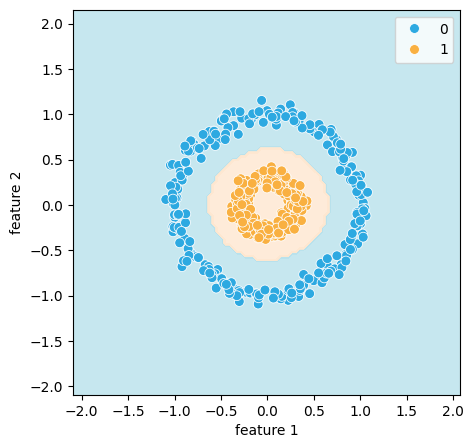

In [ ]:
clf = svm.SVC(kernel="rbf")
clf.fit(x, y)
plot_svm(x, y, clf)

Также в Sklearn реализовано `sigma` ядро. Оно интересно больше с исторической точки зрения, т.к. эквивалентно модели нейрона — Перцептрону, о котором вы узнаете на 5-й лекции. [На практике 🎓[article]](https://home.work.caltech.edu/~htlin/publication/doc/tanh.pdf) оно в большинстве случаев проигрывает RBF ядру.

$$\large K(\vec x_i, \vec x_j) = \tanh (\gamma(\vec x_i, \vec x_j)+r)$$

#Наивный Байесовский классификатор

Можно построить модель классификатора, которая будет напрямую оценивать вероятность принадлежности объекта к интересующему нас классу просто на основе информации о распределении объектов по классам в обучающей выборке. Базовую идею такого примера легко продемонстрировать на следующих данных.

## Пример на табличных данных

Загрузим `DataFrame` датасета [Wine 🛠️[doc]](https://archive.ics.uci.edu/ml/datasets/wine), который являлся примером табличных данных в первой лекции:

In [ ]:
import sklearn
from sklearn.datasets import load_wine

# https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_wine.html#sklearn.datasets.load_wine

# Download dataset
features, class_labels = load_wine(
    return_X_y=True, as_frame=True
)  # also we can get data in Bunch (dictionary) or pandas DataFrame

wine_dataset = features
wine_dataset["target"] = class_labels

wine_dataset.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


Датасет содержит объекты 3 различных классов:

In [ ]:
wine_dataset.target.unique()

array([0, 1, 2])

Возьмём первый признак `alcohol`. По имеющийся таблице с данными легко построить функцию распределения $f(x)$, которая будет задавать вероятность $p(\text{alcohol} = x)$, и найти среди наших данных бутылку вина с параметром `alcohol`, равным $x$ (слева на графике ниже).

Т.к. у нас три класса, мы можем построить распределение объектов в обучающей выборке по признаку `alcohol` отдельно для каждого из этих трёх классов. Эти распределения зададут нам условную вероятность $p(\text{alcohol} = x |\text{target} = i)$ того, что объект имеет значение признака `alcohol`, равное $x$, при условии, что он относится к одному из классов с номером $i$ (справа на графике ниже).

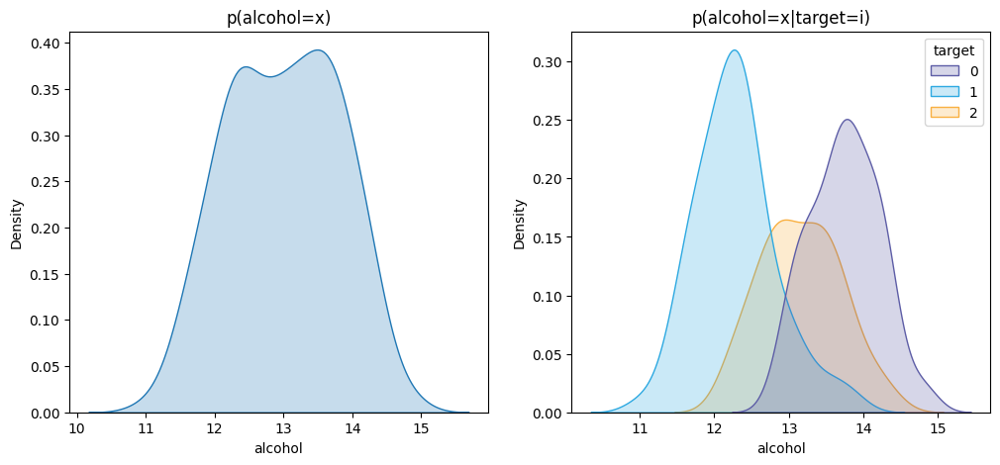

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.kdeplot(wine_dataset, x="alcohol", fill=True, ax=axes[0])
axes[0].set_title("p(alcohol=x)")

sns.kdeplot(
    wine_dataset,
    x="alcohol",
    hue="target",
    palette=sns.color_palette(["#5D5DA6", "#2DA9E1", "#F9B041"]),
    fill=True,
    ax=axes[1],
)
axes[1].set_title("p(alcohol=x|target=i)")
plt.show()

Посмотрев на плотности распределений по классам (график справа), мы можем предположить, что бутылка с значением $\text{alcohol} = 11.3$ будет относиться к 1 классу.

На языке формул наш “метод пристального вглядывания” можно записать с помощью формулы для условной вероятности по [теореме Байеса 📚[wiki]](https://en.wikipedia.org/wiki/Bayes'_theorem):

$$\large p(\text{target} = i | \text{alcohol} = x) = \frac{p(\text{alcohol} = x | \text{target} = i )p(\text{target} = i )}{p(\text{alcohol} = x)},$$

где $p(\text{target} = i)$ — доля объектов класса $i$ в датасете, а $p(\text{target} = i | \text{alcohol} = x)$ — вероятность того, что объект принадлежит классу $i$, при условии того, что признак `alcohol` у него принимает значение $x$.


Мы поняли, откуда в названии метода **Байес**. Теперь разберемся, **почему он “наивный”**.

Мы использовали только один признак: `alcohol`. Всего же у нас 13 признаков.

$$\large p(\text{target} = i |\text{features} = \vec x ) = \frac{p(\text{features} = \vec x | \text{target} = i )p(\text{target} = i )}{p(\text{features} = \vec x)}$$

**“Наивность”** Байеса состоит в том, что эта модель будет рассматривать признаки как **независимые случайные величины**:
$$\large p(\text{features} = \vec x)=p(\text{feature}_1 = x_1) \cdot p(\text{feature}_2 = x_2)...p(\text{feature}_n = x_n)$$

Если мы решаем задачу классификации на $k$ классов, то для объекта с набором признаком $\vec x$ по формуле выше мы получим $k$ чисел, характеризующих вероятность принадлежности данного объекта к различным классам. Для финального принятия решения нам останется выбрать тот класс, для которого вероятность принадлежности наивысшая:

$$\large \text{prediction} = \underset{i}{\text{argmax}}{\left(p(\text{target} = i |\text{features} = \vec x )\right)}.$$

Вернёмся к нашему датасету Wine и попробуем решить задачу классификации для него при помощи предложенного алгоритма.

Как обычно, разделим наш датасет на тренировочную и валидационную выборки:

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into train and test data
x_train, x_test, y_train, y_test = train_test_split(
    features.values, class_labels.values, test_size=0.25, random_state=42
)

Возьмём реализацию Наивного Байесовского классификатора `GaussianNB` из [библиотеки Sklearn 🛠️[doc]](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#sklearn.naive_bayes.GaussianNB). `GaussianNB` **использует оценку распределения признаков с помощью** [Гауссового распределения 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%9D%D0%BE%D1%80%D0%BC%D0%B0%D0%BB%D1%8C%D0%BD%D0%BE%D0%B5_%D1%80%D0%B0%D1%81%D0%BF%D1%80%D0%B5%D0%B4%D0%B5%D0%BB%D0%B5%D0%BD%D0%B8%D0%B5). Обучим её на тренировочном датасете и измерим качество на отложенной валидационной выборке:

In [ ]:
from sklearn.metrics import f1_score
from sklearn.naive_bayes import GaussianNB

# Train the model
model = GaussianNB()
model.fit(x_train, y_train)

# Calculate F1_score
pred = model.predict(x_test)
f1_score(y_test, pred, average="macro")

1.0

Благодаря простоте модельного датасета Wine наша наивная статистическая модель показала отличное качество работы. Это связано с “простотой” датасета — признаки классов имеют унимодальные распределения (один пик на плотности распределения), для более сложных данных (многомодальные распределения) такого не будет.

Тем не менее, подход к решению задачи классификации, связанный с построением модели предсказания принадлежности объекта к имеющимся классам, оказался конструктивным.

Идея применения наивного Байесовского классификатора в NLP задаче:
* [[colab] 🥨 Naive Bayes NLP](https://colab.research.google.com/drive/1JUMs9TBWxlCTsqw2T-y3oxMe2WZxLYtJ)

# Вероятностный подход в задаче линейной классификации

## Бинарная классификация Sigmoid

Давайте попробуем модифицировать простую линейную модель таким образом, чтобы мы могли трактовать выходы модели как вероятность. Начнем с задачи бинарной классификации. Линейная модель задается уравнением:
$$s = f(\vec x) = (\vec{w}, \vec{x}) + b$$

Выходы такой модели принимают значения от $-∞$ до $+∞$.

Нам бы хотелось получить на выходе вероятность того, что объект принадлежит к классу $1$. Вероятность принимает значения от $0$ до $1$. Нам нужна функция, которая спроецирует диапазон $(-∞,+∞)$ в диапазон $[0, 1]$.

Такой функцией является сигмоида:
$$p = \sigma(s) = \frac{1}{1+e^{-s}}$$


При $s→-∞$: $p→0$.

При $s→+∞$: $p→1$.

При $s=0$: $p=0.5$.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/scores_to_probability.png" width="500">

Значения $s$ (score) также называют [logit-ом 📚[wiki]](https://en.wikipedia.org/wiki/Logit) (пер. “логарифм”). Это связано с тем, что если выразить logit $s$ через вероятность $p$, то получится формула:
$$s(p) = \log \left(\frac{p}{1-p}\right)$$

## Многоклассовая классификация




Рассмотрим задачу классификации на примере картинок, например, для датасета CIFAR-10 (он встретится вам в задании). У нас есть входное изображение, и мы хотим получить на выходе 10 чисел, обозначающих уверенность модели в принадлежности изображения к конкретному классу.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/img_to_function_get_scores.png" width="600">







Мы можем считать по logit-у для каждого класса:
$$\begin{matrix} s_1 = (\vec{w_1}, \vec{x}) + b_1\\ s_2 = (\vec{w_2}, \vec{x}) + b_2\\ ... \\ s_n = (\vec{w_n}, \vec{x}) + b_n \end{matrix}$$

Также мы можем записать формулы выше в виде матричного перемножения. Для этого нужно преобразовать матрицу пикселей в вектор признаков (просто вытянув массив в вектор), а строки с весами модели — в матрицу.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/scalar_product_add_bias.png" width="750">

В таком случае для непересекающихся классов результатом классификации будет класс, соответствующий наибольшему logit-у.

В дальнейшем мы будем проходить нейронные сети, которые работают очень похоже.



## SoftMax

[[video] 📺 Объяснение SoftMax от StatQuest](https://www.youtube.com/watch?v=KpKog-L9veg)

Предположим, что наша модель выдала следующие значения logit-ов.

In [ ]:
logits = [[
    5.1,  # cat
    3.2,  # car
    -1.7,  # frog
]]

Тогда, чтобы узнать, какой класс наша сеть предсказала, мы могли бы просто взять `argmax` от наших `logits`:

In [ ]:
import numpy as np

print("Predicted class = %i (Cat)" % (np.argmax(logits, axis=1).squeeze()))

Predicted class = 0 (Cat)


От argmax нельзя посчитать градиент, так как производная от константы равна 0. Соответственно, если бы мы вставили производную от argmax в градиентный спуск, мы бы получили везде нули, и наша модель бы вообще ничему не научилась.

Кроме того, мы бы хотели получить не logit’ы, а настоящую вероятность $p$ на выходе модели. Да еще и таким образом, чтобы от наших вероятностей можно было посчитать градиент. Для этого мы можем применить к нашим логитам функцию **SoftMax**:
$$\large p(y=k|x=x_i) = \frac{e^{s_k(x_i)}}{\sum_{j=1}^ne^{s_j(x_i)}},$$

где $x_i$ — набор признаков, характеризующий один объект из выборки,
$s_j(x_i)$ — logit для j-го класса для объекта $x_i$.


1. **Вероятности всегда неотрицательны**. Отобразим наши logit’ы на значения $[0, +∞)$.

> Для этого возведем **экспоненту** (число Эйлера $e=2.71828$) **в степень логита**. В результате мы получим вектор гарантированно неотрицательных чисел (положительное число, возведенное в степень, даже отрицательную, даст положительное значение).

2. Классы не пересекаются, **сумма вероятностей** по всем классам **равна единице**.

>  Мы должны их **нормализовать**, то есть поделить на сумму.

Это преобразование называется **SoftMax функцией**. **Получаются вероятности**, то есть числа, которые можно интерпретировать, как вероятности.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/linear_classifier_softmax.png" width="1000">



$\displaystyle \text{SoftMax}_\text{кошка} = \frac{e^{5.1}}{e^{5.1} + e^{3.2} + e^{-1.7}}$

In [ ]:
def softmax(logits):
    return np.exp(logits) / np.sum(np.exp(logits), axis=1, keepdims=True)


print(softmax(logits))
print("Sum = %.2f" % np.sum(softmax(logits)))

[[0.86904954 0.12998254 0.00096793]]
Sum = 1.00


Можно заметить, что SoftMax никоим образом не поменял порядок значений. Самому большому logit'у соответствует самая большая вероятность, а самому маленькому, соответственно, самая маленькая.

#### Практическое вычисление SoftMax

При вычислении экспоненты от выходов модели могут получиться очень большие числа в силу очень высокой скорости роста экспоненты. Этот факт необходимо учитывать, чтобы вычисления SoftMax были численно стабильны:

In [ ]:
from warnings import simplefilter

simplefilter("ignore", category=RuntimeWarning)

f = np.array([[123, 456, 789]])
p = softmax(f)
print(f"logits = {f},\nprobabilities = {p}")

logits = [[123 456 789]],
probabilities = [[ 0.  0. nan]]


Чтобы регуляризовать вычисление, нам следует предварительно упростить возникающую в вычислении дробь. Для этого мы можем вычесть из каждого $s_i$ положительную константу, чтобы уменьшить значения экспонент. В качестве константы можно выбрать максимальный элемент этого вектора, тогда у нас гарантированно не будет очень больших чисел, и такой способ будет работать более стабильно.

$$\large M = \max_j s_{j}(x_i),$$

$$\large s^\text{new}_{j}(x_i)  = s_{j}(x_i) - M,$$

$$\large \dfrac {e^{s^\text{new}_{k}(x_i)}} {\sum_j e^{s^{new}_{j}(x_i)}}  = \dfrac {e^{s_{k}(x_i) - M }} {\sum_j e^{s_{j}(x_i) - M }} = \dfrac {e^{s_{k}(x_i)}e ^ {-M}} {\sum_j e^{s_{j}(x_i)} e ^ {-M}} = \dfrac {e ^ {-M} e^{s_{k}(x_i)}} {e ^ {-M} \sum_j e^{s_{j}(x_i)} } = \dfrac { e^{s_{k}(x_i)}} { \sum_j e^{s_{j}(x_i)} },$$

где $x_i$ — набор признаков, характеризующий один объект из выборки,
$s_j(x_i)$ — logit для $j$-го класса для объекта $x_i$.


In [ ]:
def softmax(logits):
    exp_logits = np.exp(logits - np.max(logits, axis=1, keepdims=True))
    return exp_logits / np.sum(exp_logits, axis=1, keepdims=True)


f = np.array([[123, 456, 789]])

p = softmax(f)
print(f"new logits = {f},\nprobabilities = {p}")

new logits = [[123 456 789]],
probabilities = [[5.75274406e-290 2.39848787e-145 1.00000000e+000]]


## Cross-Entropy


Итоговая последовательность преобразований будет выглядеть так:

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/linear_model_probability_pipeline.png" width="1000">

Теперь нам нужно решить, какую функцию потерь использовать. **Вероятности** принимают значения **от $0$ до $1$**. Если мы будем использовать **MAE**, [Hinge loss 📚[wiki]](https://en.wikipedia.org/wiki/Hinge_loss) или **MSE**, **максимальным значением ошибки** на указанном диапазоне будет **$1$**. А нам хочется **максимально штрафовать** модель, если она выдает для правильного класса вероятность 0.


Идея **Cross-Entropy loss** (или ее иногда называют log loss) в том, что мы хотим притянуть вероятность правильного класса к 1 и бесконечно штрафовать модель если вероятность истинного класса 0.

Для этого можно использовать функцию логорифма. Она гладкая, и для нее: $\log(1) = 0$, $\log(0) = -∞$.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/cross_entropy_plot_loss_with_probability.png" width="800">

Итого мы можем записать функцию ошибок, как:

$$\text{Loss} = - \log(p^y_\text{pred}),$$

где $p^y_\text{pred}$ — предсказанная вероятность для истиного класса. Минус нужен, т.к. $-\log(0) = ∞$.

Вернемся к задаче классификации картинок.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/logits_to_scores_to_probabilitys.png" width="900">

На картинке на входе был изображен кот. Мы можем преобразовать метки классов следующим образом:

$$ y → p_\text{true} $$

$$ p_\text{true_i}= \begin{cases} 1 & \text{для i=k, где k - номер истинного класса}, \\0 & \text{для любого } i\neq k.
 \end{cases}$$
Таким образом,
$$ y → p_\text{true} = [[1, 0, 0]]$$


В таком случае функция ошибки выше может быть записанна как [кросс-энтропия 📚[wiki]](https://en.wikipedia.org/wiki/Cross-entropy):
$$\text{Loss} = - \log(p^y_\text{true})= H(p_\text{pred}||p_\text{true})= - \sum^C_{i=1}p_\text{true_i}\cdot \log(p_\text{pred_i}) = -1⋅\log{0.87}-0\cdot\log{0.13}-0\cdot\log{0.001} = - \log(p_\text{cat}) = - \log{0.87} \approx0.14$$

Реализуем это в коде:

In [ ]:
def cross_entropy_loss(pred_prob, true_prob):
    # warning: this code does not take into account the possibility that
    # pred_prob could be equal to zero: add epsilon = 1e-9 to fix it
    return np.sum(-true_prob * np.log(pred_prob)) / pred_prob.shape[0]

# 3 classes 2 items
logits = np.array([
    [5.1, 3.2, -1.7], # one item
   #[2.1, 6.3, 1.5],  # second item
])

print(f"Logits = \n{logits}\n")

pred_prob = softmax(logits)
print(f"Predicted Probabilities = \n{pred_prob}\n")

# 3 classes 2 items
true_prob = np.array([
    [1.0, 0.0, 0.0],  # one item
   #[0.0, 1.0, 0.0],  # second item
])
print(f"True Probabilities = \n{true_prob}\n")

print(f"Cross-entropy loss = {cross_entropy_loss(pred_prob, true_prob):.3f}")

Logits = 
[[ 5.1  3.2 -1.7]]

Predicted Probabilities = 
[[0.86904954 0.12998254 0.00096793]]

True Probabilities = 
[[1. 0. 0.]]

Cross-entropy loss = 0.140


### Математический смысл

**Кросс-энтропия** имеет глубокий математический смысл в теории информации и статистике. Она связана с [энтропией 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%98%D0%BD%D1%84%D0%BE%D1%80%D0%BC%D0%B0%D1%86%D0%B8%D0%BE%D0%BD%D0%BD%D0%B0%D1%8F_%D1%8D%D0%BD%D1%82%D1%80%D0%BE%D0%BF%D0%B8%D1%8F) $H(P)$ и  [расстоянием Кульбака — Лейблера 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%A0%D0%B0%D1%81%D1%81%D1%82%D0%BE%D1%8F%D0%BD%D0%B8%D0%B5_%D0%9A%D1%83%D0%BB%D1%8C%D0%B1%D0%B0%D0%BA%D0%B0_%E2%80%94_%D0%9B%D0%B5%D0%B9%D0%B1%D0%BB%D0%B5%D1%80%D0%B0) $D_{KL}(P||Q)$:


$$H(P||Q) = D_{KL}(P||Q) + H(P)$$


Подробнее об этом можно почитать тут:
* [[colab] 🥨 Cross-entropy](https://colab.research.google.com/drive/1DFhT24njhb4LA2g6iJtl2diH-YPtD2Z4
)

### Binary Cross-Entropy

Для задачи бинарной **классификации** или **multi-label классификации** (одному объекту может соответствовать несколько классов) используют модификацию cross-entropy, которую называют **binary cross-entropy**:

$$\text{Loss} =  - \sum^C_{i=1}(p_\text{true_i}\cdot \log(p_\text{pred_i}) + (1-p_\text{true_i})\cdot \log(1-p_\text{pred_i}))$$

В этом случае порог вероятности 0.5 может быть не оптимальным для определения класса. Подробнее про выбор оптимального порога рекомендуем почитать:
* [[blog] ✏️ A Gentle Introduction to Threshold-Moving for Imbalanced Classification](https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/)

### Градиент функции потерь. Кросс-энтропия




Итоговая последовательность преобразований будет выглядеть так:

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/linear_model_probability_pipeline.png" width="1000">

[[blog] ✏️ Cross-Entropy Loss](https://wandb.ai/wandb_fc/russian/reports/---VmlldzoxNDI4NjAw)

Посчитаем производную от функции ошибок. Функция ошибок:

$$ L = - \sum_i p_\text{true_i} \log p_\text{pred_i} = -\sum_i p_\text{true_i} \log(\dfrac {e^{s_i}} {\sum_j e^{s_j}}),$$

где $s_i$ — это логиты классов, получаемые из линейной модели:

$$s_i = w_i x$$

Для расчета градиента будем использовать chain rule:

$$ \dfrac {\partial L} {\partial w_i} = \dfrac {\partial L} {\partial s_i} \dfrac {\partial s_i} {\partial w_i} $$

Градиент логитов по весам:

$$\dfrac {\partial s_i} {\partial w_i} = x$$

У нас только одна истинная метка класса $p_\text{true_k} = 1$, для $i\neq k$ $p_\text{true_k}=0$

$$ L = -1⋅ \log p_\text{pred_k} = - \log(\dfrac {e^{s_k}} {\sum_j e^{s_{j}}})$$



У нас два случая:
1. **Производная по истинному логиту** (значение логита входит в числитель и знаменатель дроби).
2. **Производная по остальным логитам** (значение логита входит только в знаменатель дроби).

Начнем с истинного логита:
1. Производная по $s_{k}$. Вынесем минус, чтобы не потерять:

$$ -L = \log(\dfrac {e^{s_{k}}} {\sum_j e^{s_{j}}}) = \log e^{s_{k}} - \log  \sum_j e^{s_{j}}  = s_{k} - \log  \sum_j e^{s_{j}}$$

$$\dfrac {\partial -L} {\partial s_{k}} = 1 - \dfrac 1 {\sum_j e^{s_{j}}} \cdot \dfrac {\partial {\sum_j e^{s_{j}}}} {\partial s_{k}} = 1 - \dfrac 1 {\sum_j e^{s_{j}}} \cdot \dfrac {\partial e^{s_{k}}} {\partial s_{k}} = 1 - \dfrac {e^{s_{k}}} {\sum_j e^{s_{j}}} = 1 - p_k$$

Вспомним про минус:

$$\dfrac {\partial L} {\partial s_{j}} = p_k - 1 $$

2. Для остальных логитов $i \neq k$. Вынесем минус, чтобы не потерять:

$$ -L = \log(\dfrac {e^{s_{i}}} {\sum_j e^{s_{j}}}) = \log e^{s_{k}} - \log  \sum_j e^{s_{j}}  = s_{k} - \log  \sum_j e^{s_{j}}$$

$$\dfrac {\partial -L} {\partial s_{i}} = - \dfrac 1 {\sum_j e^{s_{j}}} \cdot \dfrac {\partial {\sum_j e^{s_{j}}}} {\partial s_{i}} =  \dfrac 1 {\sum_j e^{s_{i}}} \cdot \dfrac {\partial e^{s_{i}}} {\partial s_{i}} = \dfrac {e^{s_{i}}} {\sum_j e^{s_{j}}} = - p_i$$

Вспомним про минус:

$$\dfrac {\partial L} {\partial s_{j}} = p_i $$

Получаем:
$$ \dfrac {\partial L} {\partial s_{i}}  =  \begin{cases} p_i - 1 & \text{для i=k, где k - номер истинного класса}, \\p_i & \text{для любого } i\neq k.
 \end{cases} $$

Применим **chain rule**:

$$ \dfrac {\partial L} {\partial w_i}  = \dfrac {\partial L} {\partial s_{i}} \dfrac {\partial s_{i}} {\partial w_i}  =  \begin{cases}(p_i - 1)x & \text{для i=k, где k - номер истинного класса}, \\p_ix & \text{для любого } i\neq k.
\end{cases} $$

В коде это будет выглядеть вот так:

In [ ]:
# Input batch of 2 vector with 4 elements
x = np.array([
    [1, 2, 3, 4],
    [1, -2, 0, 0]
])
# Weights
W = np.random.randn(3, 4)  # 3 class

# model output
logits = x.dot(W.T)
print("Scores(Logits) \n", logits, "\n")

# Probabilities
probs = softmax(logits)  # defined before
print("Probs \n", probs, "\n")

# Ground true classes
y = [0, 1]

# Derivative
dl_ds = probs.copy()
dl_ds[np.arange(len(y)), y] += -1  # substract one from true class prob
dW = x.T.dot(dl_ds)  # dot product with input

print("Grads dL/dW \n", dW)  # have same shape as W

Scores(Logits) 
 [[-2.00292658 -2.45125087 -1.13191155]
 [-3.49522474 -0.09054143  4.41902602]] 

Probs 
 [[2.48260169e-01 1.58563155e-01 5.93176677e-01]
 [3.61389102e-04 1.08795323e-02 9.88759079e-01]] 

Grads dL/dW 
 [[-0.75137844 -0.83055731  1.58193576]
 [-1.50420244  2.29536725 -0.7911648 ]
 [-2.25521949  0.47568946  1.77953003]
 [-3.00695933  0.63425262  2.37270671]]


# Практические особенности работы с линейными моделями

## Нормализация данных

Мы уже обсудили, зачем нужна нормализация данных для линейной модели. В данном разделе мы обсудим виды нормализации более подробно.

Загрузим датасет с образцами здоровой и раковой ткани. Датасет состоит из 569 примеров, где каждой строчке из 30 признаков соответствует класс `1` злокачественной (*malignant*) или `0` доброкачественной (*benign*) ткани. Задача состоит в том, чтобы по 30-ти признакам обучить модель определять тип ткани (злокачественная или доброкачественная).


In [ ]:
import sklearn.datasets

cancer = sklearn.datasets.load_breast_cancer()  # load data

x = cancer.data  # features
y = cancer.target  # labels(classes)
print(f"x shape: {x.shape}, y shape: {y.shape}")
print(f"x[0]: \n {x[0]}")
print(f"y[0]: \n {y[0]}")

x shape: (569, 30), y shape: (569,)
x[0]: 
 [1.799e+01 1.038e+01 1.228e+02 1.001e+03 1.184e-01 2.776e-01 3.001e-01
 1.471e-01 2.419e-01 7.871e-02 1.095e+00 9.053e-01 8.589e+00 1.534e+02
 6.399e-03 4.904e-02 5.373e-02 1.587e-02 3.003e-02 6.193e-03 2.538e+01
 1.733e+01 1.846e+02 2.019e+03 1.622e-01 6.656e-01 7.119e-01 2.654e-01
 4.601e-01 1.189e-01]
y[0]: 
 0


Быстрее и удобнее можно посмотреть на данные, используя pandas. К тому же, Colab добавил возможность визуализации данных (для этого можно тыкнуть синий значок диаграммы ▆ █ ▄  справа от таблицы):

In [ ]:
import pandas as pd

cancer_df = pd.DataFrame(data=cancer.data, columns=cancer.feature_names)
cancer_df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


Colab делает не полную визуализацию признаков, но и на данных изображениях можно найти полезную **информацию о выбросах** (из графика **Values**), **плотности распределений** (из графика **Distributions**) и о наличии **зависимости между переменными** (из графика **2-d distributions**). Например, мы можем увидеть, что значения признаков *mean area* и *mean perimeter* имеют зависимость, близкую к линейной, что не очень хорошо (почему, обсудим позже).

Кроме того, можно тыкнуть на рисунок, посмотреть и скопировать код визуализации, чтобы применить к другим данным или изменить под свои нужды.

Теперь давайте посмотрим на сами данные. У нас есть 569 строк, в каждой из которой по 30 колонок. Такие колонки называют признаками или *features*. Попробуем математически описать все эти признаки (mean, std, min и тд).

In [ ]:
cancer_df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


То же самое, но в виде графика. Видно, что у фич совершенно разные диапазоны  значений.

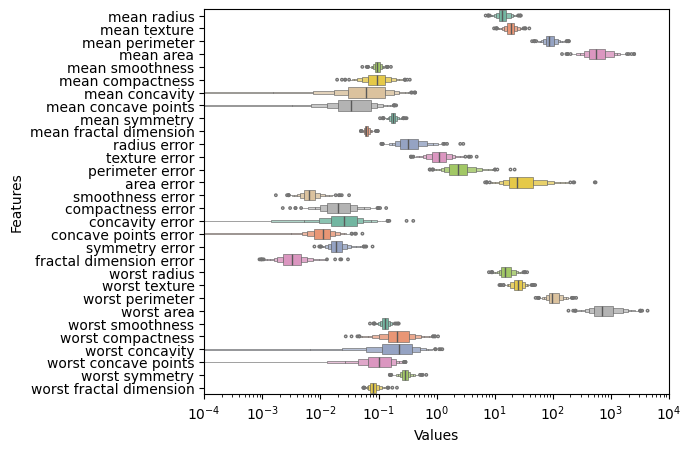

In [ ]:
import seaborn as sns
from matplotlib import pyplot as plt


plt.figure(figsize=(6, 5))
ax = sns.boxenplot(
    data=cancer_df,
    orient="h",
    palette="Set2",
    linewidth=0.4,
    flier_kws={"marker": "o", "s": 3},
    line_kws={"linewidth": 1},
)
ax.set(xscale="log", xlim=(1e-4, 1e4), xlabel="Values", ylabel="Features")
plt.show()

Линейная модель представляет собой **сумму взвешенных признаков**. Если мы приведем признаки к **единому масштабу**, мы сможем **оценить их вклад в модель** по значениям весов. Кроме того, работать с признаками в одном диапазоне вычислительно удобно. Для этого будем использовать нормализацию.


### Выбор Scaler

**Нормализацией** называется процедура приведения входных данных к **общим значениям математических статистик**.

Нормализация строит **взаимно однозначное соответствие** между некоторыми размерными величинами (которые измеряются в метрах, килограммах, годах и т. п.) и их безразмерными аналогами. Исходные значения **можно восстановить**, зная статистики оригинальных данных и правило, по которому делалась нормализация.  


Часто используют следующие варианты нормализации:  **`MinMaxScaler`**, **`StandardScaler`**, **`RobustScaler`**.

Идея **`MinMaxScaler`** заключается в том, что он преобразует данные из имеющегося диапазона значений в диапазон от $0$ до $1$. Может быть полезно, если нужно выполнить преобразование, в котором отрицательные значения не допускаются (например, масштабирование RGB пикселей).

$$\large z_i=\frac{X_i-X_{\min}}{X_{\max}-X_{\min}},$$

где $z_i$ — масштабированное значение, $X_i$ — текущее значение, $X_{\min}$ и $X_{\max}$ — минимальное и максимальное значения имеющихся данных.

Идея **`StandardScaler`** заключается в том, что он преобразует данные таким образом, что распределение будет иметь среднее значение $0$ и стандартное отклонение $1$. Большинство значений будет находиться в диапазоне от $-1$ до $1$. Это стандартная трансформация, и она применима во многих ситуациях.

$$\large z_i=\frac{X_i-u}{s},$$

где $u$ — среднее значение (или $0$ при `with_mean=False`), $s$ — стандартное отклонение (или $0$ при `with_std=False`).

И `StandardScaler`, и `MinMaxScaler` чувствительны к наличию выбросов. **`RobustScaler`** использует медиану и основан на *процентилях*. $k$-й процентиль — это величина, равная или не превосходящая $k$ процентов чисел во всём имеющемся распределении. Например, 50-й процентиль (медиана) распределения таков, что 50% чисел из распределения не меньше данного числа.

Соответственно, `RobustScaler` не зависит от небольшого числа очень больших предельных выбросов (outliers). Следовательно, результирующий диапазон преобразованных значений признаков больше, чем для предыдущих скэйлеров и, что более важно, примерно одинаков.

$$\large z_i=\frac{X_i-X_\text{median}}{IQR},$$

где $X_\text{median}$ — значение медианы, $IQR$ — межквартильный диапазон, равный разнице между 75-ым и 25-ым процентилями.

Сравним `MinMaxScaler`, `StandardScaler`, `RobustScaler` для случайного набора признаков.

In [ ]:
import random

random.seed(0)
random_names = random.sample(list(cancer.feature_names), 8)
cut_df = cancer_df[random_names]

Перед выбором нормализации **важно разобраться с природой выбросов**. Для этого нужно посмотреть на выбросы с точки зрения эксперта и попробовать определить, являются ли выбросы ошибкой при сборе данных или редкими случаями, которые необходимо сохранить.

Мы не являемся экспертами в медицине и мало знаем о данных, поэтому будем считать, что наши признаки имеют распределение, близкое к нормальному. Поэтому мы будем использовать `StandardScaler`. `StandardScaler` часто используют как нормировку по умолчанию.

In [ ]:
x_norm = StandardScaler().fit_transform(cancer_df)  # scaled data

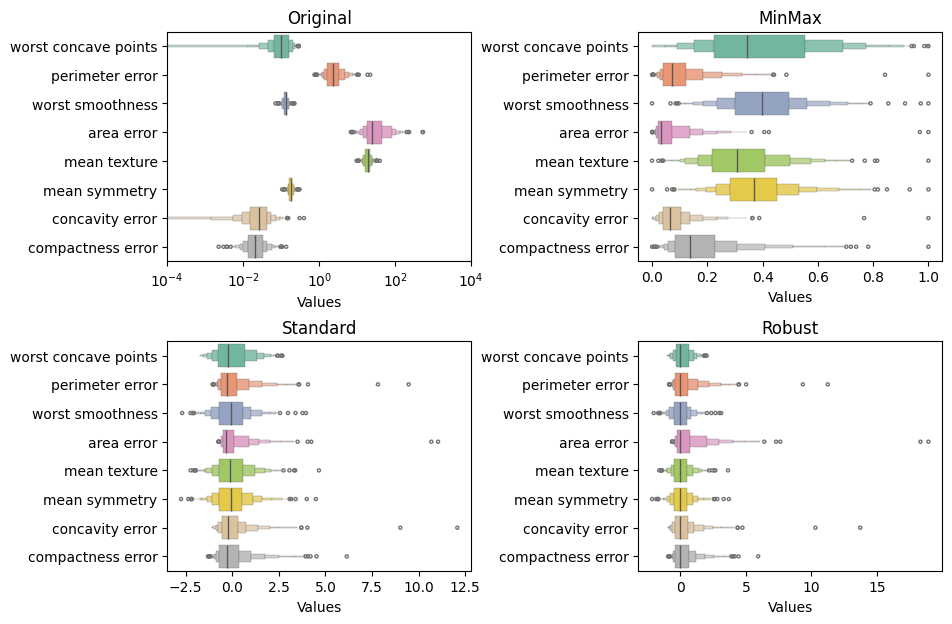

In [ ]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler


def plot_norm(df, ax, title):
    sns.boxenplot(
        df,
        orient="h",
        palette="Set2",
        ax=ax,
        linewidth=0.2,
        flier_kws={"marker": "o", "s": 5},
        line_kws={"linewidth": 1},
    )
    ax.set(xlabel="Values", title=title)


fig, axs = plt.subplots(2, 2, figsize=(10, 7))

plot_norm(cut_df, axs[0][0], "Original")
axs[0][0].set(xscale="log", xlim=(1e-4, 1e4))
min_max_x = MinMaxScaler().fit_transform(cut_df)
plot_norm(pd.DataFrame(min_max_x, columns=random_names), axs[0][1], "MinMax")

std_x = StandardScaler().fit_transform(cut_df)
plot_norm(pd.DataFrame(std_x, columns=random_names), axs[1][0], "Standard")

rob_x = RobustScaler().fit_transform(cut_df)
plot_norm(pd.DataFrame(rob_x, columns=random_names), axs[1][1], "Robust")

plt.subplots_adjust(wspace=0.55, hspace=0.35)

plt.show()

Видим, что они стали намного более сравнимы между собой.

In [ ]:
pd.DataFrame(x_norm, columns=cancer.feature_names).describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,...,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,-3.153111e-15,-6.568462e-15,-6.993039e-16,-8.553985e-16,6.081447e-15,-1.136369e-15,-2.997017e-16,1.023981e-15,-1.860648e-15,-1.504752e-15,...,-2.297713e-15,1.742016e-15,-1.198807e-15,6.118909e-16,-5.094929e-15,-2.122887e-15,6.118909e-16,-1.998011e-16,-2.422589e-15,2.497514e-15
std,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,...,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00
min,-2.029648e+00,-2.229249e+00,-1.984504e+00,-1.454443e+00,-3.112085e+00,-1.610136e+00,-1.114873e+00,-1.261820e+00,-2.744117e+00,-1.819865e+00,...,-1.726901e+00,-2.223994e+00,-1.693361e+00,-1.222423e+00,-2.682695e+00,-1.443878e+00,-1.305831e+00,-1.745063e+00,-2.160960e+00,-1.601839e+00
25%,-6.893853e-01,-7.259631e-01,-6.919555e-01,-6.671955e-01,-7.109628e-01,-7.470860e-01,-7.437479e-01,-7.379438e-01,-7.032397e-01,-7.226392e-01,...,-6.749213e-01,-7.486293e-01,-6.895783e-01,-6.421359e-01,-6.912304e-01,-6.810833e-01,-7.565142e-01,-7.563999e-01,-6.418637e-01,-6.919118e-01
50%,-2.150816e-01,-1.046362e-01,-2.359800e-01,-2.951869e-01,-3.489108e-02,-2.219405e-01,-3.422399e-01,-3.977212e-01,-7.162650e-02,-1.782793e-01,...,-2.690395e-01,-4.351564e-02,-2.859802e-01,-3.411812e-01,-4.684277e-02,-2.695009e-01,-2.182321e-01,-2.234689e-01,-1.274095e-01,-2.164441e-01
75%,4.693926e-01,5.841756e-01,4.996769e-01,3.635073e-01,6.361990e-01,4.938569e-01,5.260619e-01,6.469351e-01,5.307792e-01,4.709834e-01,...,5.220158e-01,6.583411e-01,5.402790e-01,3.575891e-01,5.975448e-01,5.396688e-01,5.311411e-01,7.125100e-01,4.501382e-01,4.507624e-01
max,3.971288e+00,4.651889e+00,3.976130e+00,5.250529e+00,4.770911e+00,4.568425e+00,4.243589e+00,3.927930e+00,4.484751e+00,4.910919e+00,...,4.094189e+00,3.885905e+00,4.287337e+00,5.930172e+00,3.955374e+00,5.112877e+00,4.700669e+00,2.685877e+00,6.046041e+00,6.846856e+00


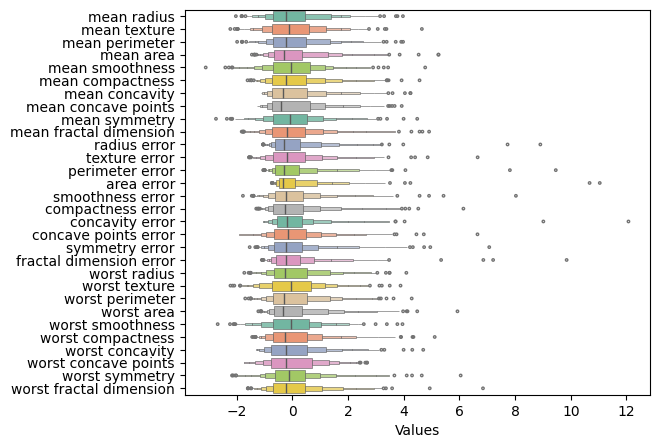

In [ ]:
plt.figure(figsize=(6, 5))
ax = sns.boxenplot(
    data=pd.DataFrame(x_norm, columns=cancer.feature_names),
    orient="h",
    palette="Set2",
    linewidth=0.4,
    flier_kws={"marker": "o", "s": 3},
    line_kws={"linewidth": 1},
)
ax.set(xlabel="Values")
plt.show()

## Проблема корреляции признаков

Часто может оказаться, что признаковое описание объекта избыточно и между различными признаками имеются связи. Для устойчивости работы линейных моделей важно, чтобы среди признаков не было скоррелированных пар.

Например, если мы будем решать задачу регрессии на наборе признаков $x_1 \dots x_n$, среди которых есть связь $x_2 = 5 x_1$, и возьмём линейную модель вида
$$\large y = w_1 x_1 + w_2 x_2 + \dots + w_n x_n + b,$$
то с учётом данной связи мы можем записать:
$$\large y = w_1 x_1 + w_2 (5x_1) + \dots + w_n x_n + b = (w_1 + 5 w_2) x_1 +  w_3 x_3 + \dots + w_n x_n + b.$$

Таким образом, наша модель теперь учитывает признак $x_1$ с одним "общим" весом $(w_1 + 5 w_2)$, несмотря на то, что он закодирован двумя независимыми параметрами. Решение, то есть набор весовых коэффициентов $w_i$, перестало быть единственным, так как мы теперь можем делать произвольные преобразования с числами $w_1$ и $w_2$ до тех пор, пока $(w_1 + 5 w_2)$ остаётся неизменным:

$$(w_1 + 5 w_2) = \{w_1 \rightarrow  w_1 + 5000 ,\, w_2 \rightarrow  w_2 - 1000 \} $$
$$(w_1 + 5 w_2) = \{w_1 \rightarrow  w_1 + 5000000 ,\, w_2 \rightarrow  w_2 - 1000000 \} $$
$$(w_1 + 5 w_2) = \{w_1 \rightarrow  w_1 + 5000000000 ,\, w_2 \rightarrow  w_2 - 1000000000 \} $$
$$(w_1 + 5 w_2) = \{w_1 \rightarrow  w_1 + 5000000000000 ,\, w_2 \rightarrow  w_2 - 1000000000000 \} $$
$$(w_1 + 5 w_2) = \{w_1 \rightarrow  w_1 + Nan ,\, w_2 \rightarrow  w_2 + Nan\}$$

**Чем это плохо?**

В случае корреляции признаков задача не имеет единственного решения и не существует обратной матрицы, обеспечивающей аналитическое решение. Мы можем использовать градиентные методы (поговорим позже) для поиска решения, но
при этом веса модели могут неконтролируемо расти. При этом **суммарный вклад** признаков может быть **мал**.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/carrelation_problem1.png" width="700">

Мы можем оценивать **важность признаков в линейной модели**, используя **веса** перед ними (признаки должны быть нормализованы). Чем больше модуль веса, тем больше вклад. Для коррелированных признаков важность будет переоценена.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/carrelation_problem2.png" width="700">

Кроме того, нужно помнить, что диапазоны числовых переменных ограничены. При неконтролируемом росте весов значение может выйти за диапазон и превратиться в ~~тыкву~~ `Nan`.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/carrelation_problem3.png" width="700">

**Что делать?**

Визуализировать подобные зависимости можно при помощи построения матрицы попарных корреляций признаков:

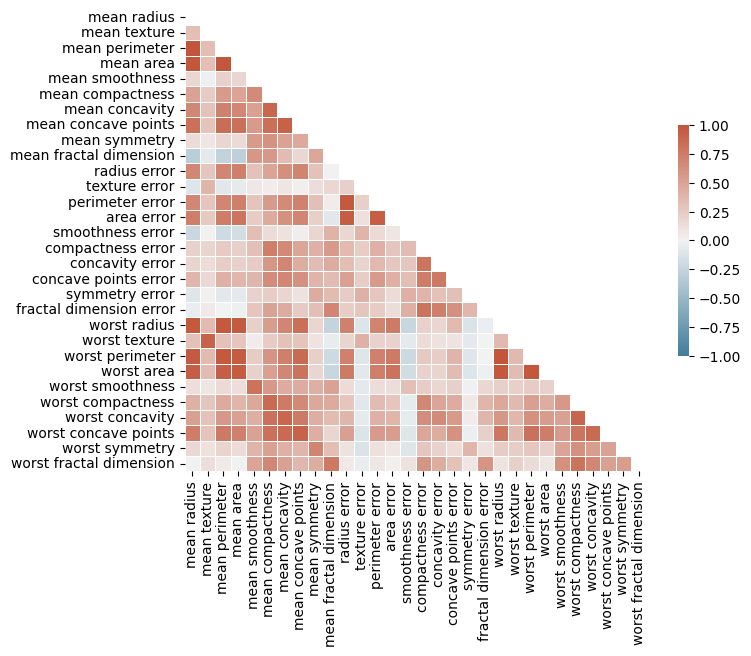

In [ ]:
import numpy as np

cancer_df = pd.DataFrame(data=cancer.data, columns=cancer.feature_names)

# Compute the correlation matrix
corr = cancer_df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(8, 6))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
    corr,
    mask=mask,
    cmap=cmap,
    vmax=1,
    vmin=-1,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
)
plt.show()

В наших данных сильно скоррелированы признаки, характеризующие размеры опухоли (мы могли видеть это выше при визуализации 2-d distributions).

В случае корреляции можно:
- **добавить регуляризацию** (о том, что такое регуляризация, мы поговорим дальше);
- **оставить один признак**;
- если есть вероятность, что при удалении признаков часть информации будет потеряна, можно оставить **один признак** неизменным и вычесть его из остальных (оставить только **разницу**). Неинформативные шумовые признаки можно удалить (как это делать, вы узнаете на 4-й лекции).


## Регуляризация


###L2 vs L1

Мы можем ограничить значения весов, введя в функционал ошибок
специальную добавку, называемую регуляризацией. L2-регуляризация имеет формулу:


$$\large L_2 = \alpha \sum_i w_i^2,$$
где $\alpha$ — это коэффициент регуляризации.


 Введение **L2-регуляризации** приводит к тому, что **большие веса больше штрафуются** и предпочтение отдается решениям, использующим **малые значения весов**. При этом модель будет **сохранять скоррелированные и неважные признаки с маленькими весами**.

Это связано с градиентом $L_2$:
$$\large L'_{2w_i} = 2\alpha w_i$$
Он будет “тянуть” модель в сторону большого количества маленьких весов.

<center><img src="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/l1_and_l2_regularization.gif" alt="alttext" width="550"/></center>

Для отбора признаков можно использовать L1-регуляризацию, она одинаково "штрафует" модель за любые ненулевые веса.

$$\large L_1 = \alpha \sum_i |w_i|$$
$$\large L_{1w_i}' = \alpha, \text{  где } w_i\neq 0$$



Для получения интуиции, что L1-регуляризация позволяет отбирать признаки, обычно используют картинку ниже. На ней член функции потерь, отвечающий за регуляризацию, жестко ограничен: $|L_\text{reg}|≤1$. Вращающиеся овалы показывают, как Loss решаемой задачи изменяется в результате изменения входных данных и таргета.

Голубая область — ограничение на значения весов, которое дает регуляризация:
- Для **L2** это **окружность**.  Оранжевая точка — это минимальное значение для функции Loss с регуляризацией. Для **L2** она будет кататься **по касательной к окружности**.
- Для **L1** ограничения на значения весов будут иметь **форму ромба**. При этом минимальное значение для функции Loss с регуляризацией будет зависать в **уголу ромба**, что соответствует **обнулению веса** одного из признаков.



<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L02/loss_landscape_with_regularization.gif" width="800"></center>

<center><em>Source: <a href="https://people.eecs.berkeley.edu/~jrs/189/">Introduction to Machine Learning
</a></em></center>


### Борьба с переобучением

__Сложность модели__ (*model complexity*) — важный гиперпараметр. В частности, для линейных моделей сложность может быть представлена **количеством параметров**, например, для полиномиальных моделей — степенью полинома.

Сложность модели связана с **ошибкой обобщения** (_generalization error_):
- **Cлишком простой модели** не будет хватать **количества параметров для обобщения сложной закономерности в данных**, что приведёт к большой ошибке обобщения.
- **Избыточная сложность модели** также приводит к большой ошибке обобщения за счет того, что в силу своей сложности модель начинает **пытаться искать закономерности в шуме**, добиваясь большей точности на тренировочных данных, теряя при этом часть обобщающей способности.



<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/model_complexity.png" width="500">

Параметры модели задают некоторую **аппроксимацию целевой функции**. Аппроксимировать целевую функцию можно несколькими способами, например:
1. Использовать все имеющиеся данные и провести ее строго **через все точки**, которые нам известны ($f1$ на картинке);
2. Использовать более простую функцию (в данном случае, линейную), которая не попадет точно во все данные, но зато будет соответствовать некоторым **общим закономерностям**, которые у них есть ($f2$ на картинке).

Характерной чертой переобучения является первый сценарий, и сопровождается он, как правило, **большими весами**. Поэтому регуляризацию используют для борьбы с переобучением.

<img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L02/out/l2_regularization.png" width="300">

Проиллюстрируем описанное явление на примере полиномиальной модели:

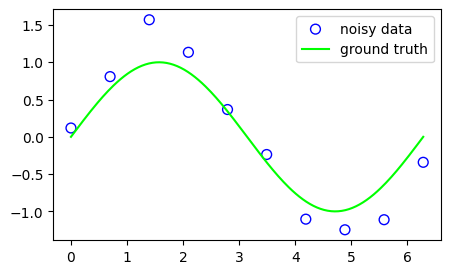

In [ ]:
x = np.linspace(0, 2 * np.pi, 10)
y = np.sin(x) + np.random.normal(scale=0.25, size=len(x))
x_true = np.linspace(0, 2 * np.pi, 200)
y_true = np.sin(x_true)

plt.figure(figsize=(5, 3))
plt.scatter(x, y, s=50, facecolors="none", edgecolors="b", label="noisy data")
plt.plot(x_true, y_true, c="lime", label="ground truth")
plt.legend()
plt.show()

Попробуем аппроксимировать имеющуюся зависимость с помощью полиномиальной модели, используя шумные данные в качестве тренировочных данных:

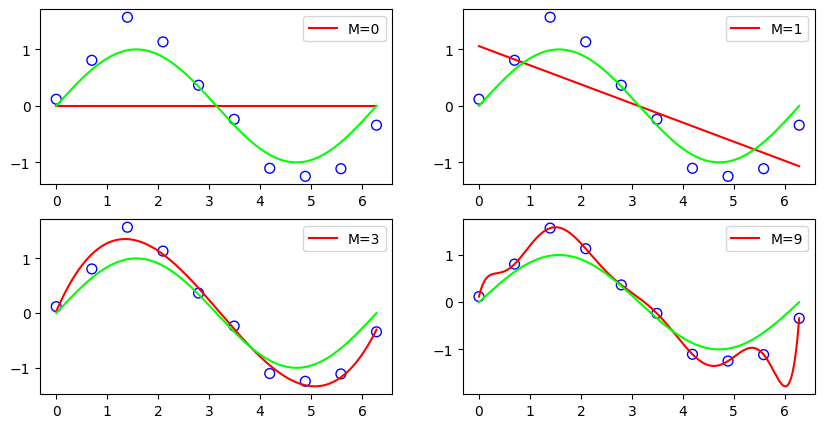

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

x_train = x.reshape(-1, 1)

fig = plt.figure(figsize=(10, 5))

for i, degree in enumerate([0, 1, 3, 9]):
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())

    model.fit(x_train, y)
    y_plot = model.predict(x_true.reshape(-1, 1))

    fig.add_subplot(2, 2, i + 1)
    plt.plot(x_true, y_plot, c="red", label=f"M={degree}")
    plt.scatter(x, y, s=50, facecolors="none", edgecolors="b")
    plt.plot(x_true, y_true, c="lime")
    plt.legend()
plt.show()

Модель **переобучается, подстраиваясь под тренировочную выборку**. В полиноме степень/количество весов — это гиперпараметр, который можно подбирать на кросс-валидации, но **ограничивая количество параметров**, мы накладываем **ограничение на обобщающую способность модели** в целом. Вместо этого можно оставить модель сложной, но использовать **регуляризатор**, который будет заставлять модель отдавать предпочтение более простому обобщению.

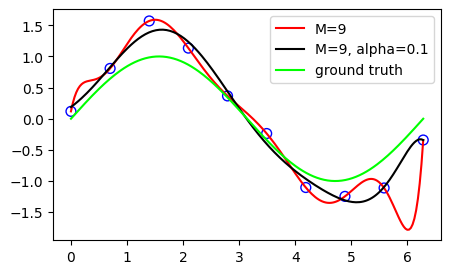

Without regularization:  y = 0.0+4.54*x+-16.57*x^2+29.57*x^3+-26.09*x^4+12.68*x^5+-3.59*x^6+0.59*x^7+-0.05*x^8+0.0*x^9
With regularization:  y = 0.0+0.67*x+0.43*x^2+0.04*x^3+-0.21*x^4+-0.04*x^5+0.07*x^6+-0.02*x^7+0.0*x^8+-0.0*x^9


In [ ]:
from sklearn.linear_model import Ridge


model = make_pipeline(PolynomialFeatures(9), LinearRegression())
model_ridge = make_pipeline(PolynomialFeatures(9), Ridge(alpha=0.1))

model.fit(x_train, y)
y_plot = model.predict(x_true.reshape(-1, 1))

model_ridge.fit(x_train, y)
y_plot_ridge = model_ridge.predict(x_true.reshape(-1, 1))

plt.figure(figsize=(5, 3))
plt.plot(x_true, y_plot, c="red", label=f"M={degree}")
plt.plot(x_true, y_plot_ridge, c="black", label=f"M={degree}, alpha=0.1")
plt.scatter(x, y, s=50, facecolors="none", edgecolors="b")
plt.plot(x_true, y_true, c="lime", label="ground truth")
plt.legend()
plt.show()

poly_coef = model[1].coef_

eq = f"y = {round(poly_coef[0], 2)}+{round(poly_coef[1], 2)}*x"
for i in range(2, 10):
    eq += f"+{round(poly_coef[i], 2)}*x^{i}"

print("Without regularization: ", eq)

poly_coef = model_ridge[1].coef_

eq = f"y = {round(poly_coef[0], 2)}+{round(poly_coef[1], 2)}*x"
for i in range(2, 10):
    eq += f"+{round(poly_coef[i], 2)}*x^{i}"

print("With regularization: ", eq)

Видно, что одним из "симптомов" переобучения являются аномально большие веса. Модель Ridge Regression, показанная в примере выше, использует L2-регуляризацию для борьбы с этим явлением.


<font size="6">Литература</font>

<font size="5">Линейная регрессия:</font>

* [[book] 📚 Метрики классификации и регрессии](https://academy.yandex.ru/handbook/ml/article/metriki-klassifikacii-i-regressii)

<font size="5">Метод градиентного спуска:</font>
* [[book] 📚 Градиентный спуск](https://www.tomasbeuzen.com/deep-learning-with-pytorch/chapters/chapter1_gradient-descent.html)
* [[book] 📚 Стохастический градиентный спуск](https://tomasbeuzen.com/deep-learning-with-pytorch/chapters/chapter2_stochastic-gradient-descent.html)

<font size="5">SVM:</font>
* [[video] 📺 Хорошее объяснение SVM](https://www.youtube.com/watch?v=_PwhiWxHK8o)
* [[book] 📚 SVM на стэнфордском курсе ](https://cs231n.github.io/linear-classify/#svm)

<font size="5">Обобщенные линейные модели:</font>
* [[blog] ✏️ Дуальная форма SVM](https://www.geeksforgeeks.org/dual-support-vector-machine/)
* [[git] 🐾 Продвинутый алгоритм, основанный на SVM](https://github.com/IvanoLauriola/MKLpy)

<font size="5">Вероятностный подход в задаче классификации:</font>
* [[video] 📺 Naive Bayes in NLP](https://www.youtube.com/watch?v=O2L2Uv9pdDA)
* Latent Dirichlet Allocation:
 * [[video] 📺 Latent Dirichlet Allocation (Part 1 of 2)](https://www.youtube.com/watch?v=T05t-SqKArY),
 * [[video] 📺 Training Latent Dirichlet Allocation: Gibbs Sampling (Part 2 of 2)](https://www.youtube.com/watch?v=BaM1uiCpj_E).
* [[video] 📺 Объяснение SoftMax от StatQuest](https://www.youtube.com/watch?v=KpKog-L9veg)
* [[video] 📺 Объяснение KL Divergence](https://www.youtube.com/watch?v=SxGYPqCgJWM)